<span style='font-size:xx-large'>Assignment 4: Markov Chain Monte Carlo</span>

<span style='font-size:medium'>Group 2</span>: Tyler Donovan, Amber Banks, Jason Reeves, Georgie Lindsay



<span style='font-size:x-large'>CONTENTS:</span>

<span style='font-size:large'>1 INTRODUCTION</span>

<span style='font-size:large'>2 BACKGROUND KNOWLEDGE</span>

<span style='font-size:large'>3 INITIALISING</span>

<span style='font-size:large'>4 METROPOLIS ALGORITHM MCMC</span>

<span style='font-size:large'>5 TEST MODEL FUNCTION</span>

<span style='font-size:large'>6 ASTRONOMY DATA APPLICATION</span>



<span style='font-size:xx-large'>1 Introduction</span>

Model building and testing is the backbone of any physical science and rings especially true for astrophysics. Given some galaxy's spectra there's enough information to tell us about the galaxies mass, star formation rate \(SFR\), dust properties, and stellar age. However, all this information is mixed together so trying to tease out these properties means simultaneously determining a dozen parameters such as line and break identification, calculating line widths, and fitting black body curves to IR spectra. This extends far beyond something that can be done on chalkboard or paper, we need to involve numerical computation to fit our data in a reasonable time and estimate confidence.

In this notebook we'll explore how to build a generalized Markov Chain Monte Carlo simulation using the Metropolis algorithm. For astrophysics we see this commonly applied as a fitting algorithm to find the parameters from spectra, photometry, or light curve data. Later in this notebook we'll put this to the test and try to fit a spectrum to identify lines and their widths, calculate the redshift, and estimate the SFR. But first, lets cover some background information on MCMC simulations, and the Metropolis Algorithm in particular. 


<span style='font-size:xx-large'>2 Background Knowledge</span>

##### <span style='font-size:large'>Monte Carlo Method:</span>

<span style='font-size:small'>Before we explain what a Markov Chain Monte Carlo algorithm \(or MCMC for short\) is, it is worth giving a refresher as to what a Monte Carlo method is. Simply put, a Monte Carlo algorithm is an algorithm that relies on independent random sampling from a distribution or data set to understand some desired aspect \(note that in a Bayesian context, this is usually the best model to understand something about the data given our priors\). While this may sound a bit abstract, this has many valuable applications. For example, since we are all \(hopefully\) interested in astrophysics, we could use a Monte Carlo algorithms to simulate a population of stars whose properties are drawn from various probability distributions, how likely they are to eclipse, and which of our factors effect this the most \(this is definitely a very original example that is in no way drawn from something else whatsoever\). Needless to say, Monte Carlo algorithms are both very effective and powerful. However, depending on the nature of our data and model, our typical Monte Carlo algorithms are not always sufficient. This is particularly seen when we add more dimensions to our sample space, where the amount of samples we need to simulate increases exponentially as we increase our number of dimensions which can often be computationally unfeasible. Additionally, though Monte Carlo simulations assume independence, the process of drawing samples from a distribution may not always be independent of a previous draw. In these situations, we should use a MCMC instead!</span>

## <span style='font-size:large'>Markov Chain:</span>

<span style='font-size:small'>In the previous section, we explained the second "MC" in MCMC. Now it's time to explain the first "MC" in MCMC which is short for "Markov Chain." So, what exactly is a Markov Chain? Well, long story short, it's a "chain" of variables where the probability of something being selected to be the next variable in the chain depends on the previous variable.</span>

<span style='font-size:large'>MCMC \(Markov Chain Monte Carlo\):</span>

So, putting these two things together, what is an MCMC? Well, it's basically the process of doing a Monte Carlo simulation where the process of drawing our next sample is done through a Markov Chain. As for the benefits of this, first, the nature of drawing our samples from a Markov Chain allows us to factor in dependence into what we're simulating rather than the assumption of independence used in a Monte Carlo simulation. Second, this allows us to better go through our data in higher dimensions. The basic principle of an MCMC is to explore the full set of possible parameters of your model \(the parameter space\) to see how well each set of possible parameters explains your data. With any luck the MCMC will identify the best set of parameters to match your data as well as the confidence to which those parameters are correct within the posterior. However, it is important to note that these algorithms are very sensitive to their starting guess and as such, have a burn\-in period. In spite of this drawback, however, MCMCs remain incredibly useful and powerful. In this notebook, we will explain how to code one of the "easier" MCMC algorithms known as the "Metropolis Algorithm."

- Reference: [https://machinelearningmastery.com/markov\-chain\-monte\-carlo\-for\-probability/](https://machinelearningmastery.com/markov-chain-monte-carlo-for-probability/) 

<span style='font-size:large'>METROPOLIS ALGORITHM:</span>

The Metro algorithm dictates that we'll more or less make a random walk around the space to map what's out there. We'll start with an initial set of values to initialize the loop. After calculating the posterior there we'll make a "jump" to a new point in parameter space, selecting a new set of possible parameters for our model near our previous point and calculate the posterior there. If the posterior is higher \(which means a better fit\) then we'll keep it, if it's not we won't immediately throw it out but rather roll the dice and see whether we keep it or not. The probability that we'll keep these inferior values for our Markov Chain is equal to the ratio of the new posterior to the old one:

$P_{\text{keep}} = \Large\frac{P_{\text{new}}}{P_{\text{old}}}$

This is meant to strike a balance such that we try new values and don't get stuck in local minima but don't waste our time sampling garbage areas of parameter space far from where the fit actually approaches our data.

<span style='font-size:large'>...</span>



<span style='font-size:xx-large'>3 Initialising</span>

<span style='font-size:medium'>Here we import our necessary libraries. Note that we import astropy in order to be able to read the files that we use for our data for our of spectra.</span>



In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import scipy as sci
import astropy.io as astro
from astropy.io import fits
from astropy.cosmology import WMAP9 as cosmo
import scipy

#yes, I'm going to turn off warnings. Call the cops, I don't care
import warnings

<span style='font-size:xx-large'>4 Metropolis Algorithm MCMC</span>

In the background section of this notebook, we already discussed the general procudeure for the Metropolis algorithm. Now lets break down the steps of our group\-created MCMC function. 

1. initialize chains: create a 3D array to hold all of our markov chains, this array is initally empty and will update as we identify better parameters 
2. initialize parameters and functions: 

- - Parameters: the initial parameters are the ones we specify in the input of the MCMC function
  - Prior: the prior is the probability that our parameters are accurate, the initial prior is given as a function 
  - Likelihood: the likelihood is the probability of our data occuring based on the given parameters, 
  - posterior: the probability that our parameters are accurate based on the given likelihood data

3. For each chain, generate a new set of parameters according to a proposal function 
4. For each chain, calculate the posterior, that is the probability that the new parameters are accurate based on the prior and the likelihood data
5. If the new posterior is better than the old one, keep the updated parameters 
6. If the new posterior is worse than the old one, "roll dice" to decide if you keep the updated parameters
7. append parameters to markov chains



<span style='font-size:large'>METROPOLIS MCMC FUNCTION</span>



In [15]:
# Metropolis MCMC function

def metropolis_mcmc(x_data, y_data, y_err, model_func, log_likelihood_func, log_prior, proposal_func, params_initial, num_iterations, burn_in):
    """
    Args:
    - x_data (array): observed x data
    - y_data (array): observed y data
    - y_err (array): observed y data error
    - log_likelihood_func (function): 
    - log_prior_func (function):
    - proposal_func (function):
    - params_initial (array): initial model parameters
    - num_interations (int): number of iterations
    - burn_in (int): number of iterations to cut out due to burn-in
    
    Returns:
    - params_ideal (array): ideal model parameters
    - markov_chains (array): 
    
    """
    
    #1 Initialising the Markov chains
    num_chains = params_initial.shape[0]
    num_params = params_initial.shape[1]
    markov_chains = np.zeros((num_chains, num_params, num_iterations))
    
    #2 Initialising the likelihood, prior, and posterior
    params_old = params_initial
    log_prior_old = np.zeros(num_chains)
    log_likelihood_old = np.zeros(num_chains)
    log_posterior_old = log_likelihood_old + log_prior_old
    
    for ii in range(num_chains):
        
        #initalize the likelihood
        log_likelihood_old[ii] = log_likelihood_func(y_data, model_func(x_data, params_old[ii]), y_err)
        
        #initialize the prior
        log_prior_old[ii] = 0
        
        for jj in range(num_params):
            log_prior_func = log_prior[jj]
            log_prior_old[ii] =+ log_prior_func(params_old[ii, jj])
            
        #initalize the posterior
        log_posterior_old[ii] = log_likelihood_old[ii] + log_prior_old[ii]
    
    
    # Loop through the number of iterations and generate random numbers for parameters
    for ii in range(num_iterations):
        
        # Generating multiple y_models from the various chains occurring simultaneously
        y_model = np.zeros((num_chains, len(x_data)))

        log_likelihood_current = np.zeros(num_chains)
        log_prior_current = np.zeros(num_chains)
        log_posterior_current = np.zeros(num_chains)
        params_current = np.zeros((num_chains, num_params))
        
        #3 for each chain generate current parameters according to a proposal function
        for jj in range(num_chains):
            
            #set paramters for this markov chain
            params_current[jj] = proposal_func(params_old[jj])
            
            #print(params_current)
            
            #find the model y values from the current set of parameters
            y_model[jj] = model_func(x_data, params_current[jj])
            
            #calculate the log_likelihoods of the chains from their models
            log_likelihood_current[jj] = log_likelihood_func(y_data, y_model[jj], y_err)
            
            #initialize the prior
            log_prior_current[jj] = 0
        
            for kk in range(num_params):
                log_prior_func = log_prior[kk]
                log_prior_current[jj] =+ log_prior_func(params_current[jj, kk])
            
            #4 calculate the log_posterior, based on the prior and likelihood
            log_posterior_current[jj] = log_likelihood_current[jj] + log_prior_current[jj]
            
            #test to see if we should keep these parameters for each chain
        
            #5 if the new fit is better, then keep the parameters
            if log_posterior_current[jj] > log_posterior_old[jj]:

                params_old[jj] = params_current[jj]

                log_posterior_old[jj] = log_posterior_current[jj]

                #print('Switched')

            #6 otherwise the new posterior is worse and we'll roll the dice to keep it
            else:

                log_prob_to_keep = log_posterior_current[jj] - log_posterior_old[jj]

                if np.random.rand() < 10**log_prob_to_keep:

                    params_old[jj] = params_current[jj]

                    log_posterior_old[jj] = log_posterior_current[jj]

                    #print('Switched!!!')
                    
                #print('Kept')

            #7 add the values of param_values_old to the markov chain since at this point
            #they represent the better set of parameters
            markov_chains[jj, :, ii] = params_old[jj]
           
    
    params_ideal = params_old
    
    #in case of double peaks, we want the best values to be representative of
    #where the highest peak so median will serve best
    
    params_ideal = np.median(markov_chains[:, :, burn_in:], axis=(0, 2))
    
    #cut out burn-in
    
    markov_chains = markov_chains[:, :, burn_in:]


    #find spread of posteriors

    param_stds = np.zeros(num_params)

    for ii in range(num_params):

        param_ii_chain = markov_chains[:, ii, :].flatten()

        param_stds[ii] = np.std(param_ii_chain)


    #find quality of best fit

    #chi squared

    def chi2(data, model, error):
        
        chi2 = np.sum((data - model)**2/error**2)
    
        return chi2


    #calc chi squared for the model

    y_best = model_func(x_data, params_ideal)

    best_fit_chi2 = chi2(y_data, y_best, y_err)


    #find degrees of freedom

    ν = len(x_data) - num_params

    #calculate reduced chi squared

    best_fit_red_chi2 = best_fit_chi2 / ν


    return params_ideal, markov_chains, param_stds, best_fit_red_chi2

### Likelihoods, Priors, and Proposals

The code above is set up so that anyone can utilize any method of new parameter proposal, priors on the parameters, or ways to measure the likelihood and still run the MCMC. For this notebook we'll be focusing on one method of measuring the likelihood, maximum likelihood, but you can in theory use anything like chi squared or least squares. We'll also be focusing on flat priors, but in typical MCMC use it's normal to run a sim once and use the final posterior as the prior to get more confident results. As for proposals, we'll be selecting new parameters to test from a set of normalized gaussians. Each gaussian will be centered on a parameter value with a width of 1% of the parameter's value where one value will be selected at random. The value of 1% is chosen as testing and tuning has shown it's effective in allowing the MCMC to explore parameter space without generating huge jumps that causes the chain to get off track from the true value of a parameter or exploring regions of parameter space that are junk causing too frequent of rejections. With our generator function we get the ideal 25% acceptance rate of new parameters.



In [16]:
# Test Model Initial Functions

def log_max_likelihood(y_data, y_model, y_err):
    return np.sum(norm.logpdf(y_data, y_model, y_err))

def log_flat_prior(y_model):
    return 1

def gaussian_proposal_func(params):
    return np.random.normal(params, 0.01 * abs(params))

<span style='font-size:xx-large'>5 Test Model Functions</span>

It's pretty tough to make a general code with nothing to compare it against so we'll make a sample set of data to train our MCMC on so we can visualise our progress and double check the code against the known solutions so we know we're on the right track. Here we'll store some of the functions used to test the MCMC code to make sure it works for simple and complex functions. We'll include three model functions: a linear function to represent the most basic model, a quadratic function which is one step more complex, and a double sine function to represent a complex function with a similar level of complexity as we may find in a real astrophysical application. After all, the double sine law is what we see for fitting the flux of TESS light curves due to the periodicity of brightness due to star rotation and refelction of light from the Earth as it orbits.

For purposes of checking the model we'll create some "true" values for some parameter for each model. We'll create some data that has uncertainty and noise around these true parameter values and see how well the MCMC recovers these values. We shouldn't expect that a perfect MCMC will recover the true values when there's any uncertainty or noise, that goes against the very notion of Bayesian Statistics. With noise and uncertainty the code will only be able to estimate the posteriors of various parameters. Ideally, we'll still see the posteriors of the fits peaking around where we know the true values to, although there will be some width to the posterior. The aim is that we can leverage this training on well known data and aim the MCMC at a complex application: fitting a portion of spectra to detect emission lines and measure redshift.



## <span style='font-size:large'>Test 1: Linear Function</span>



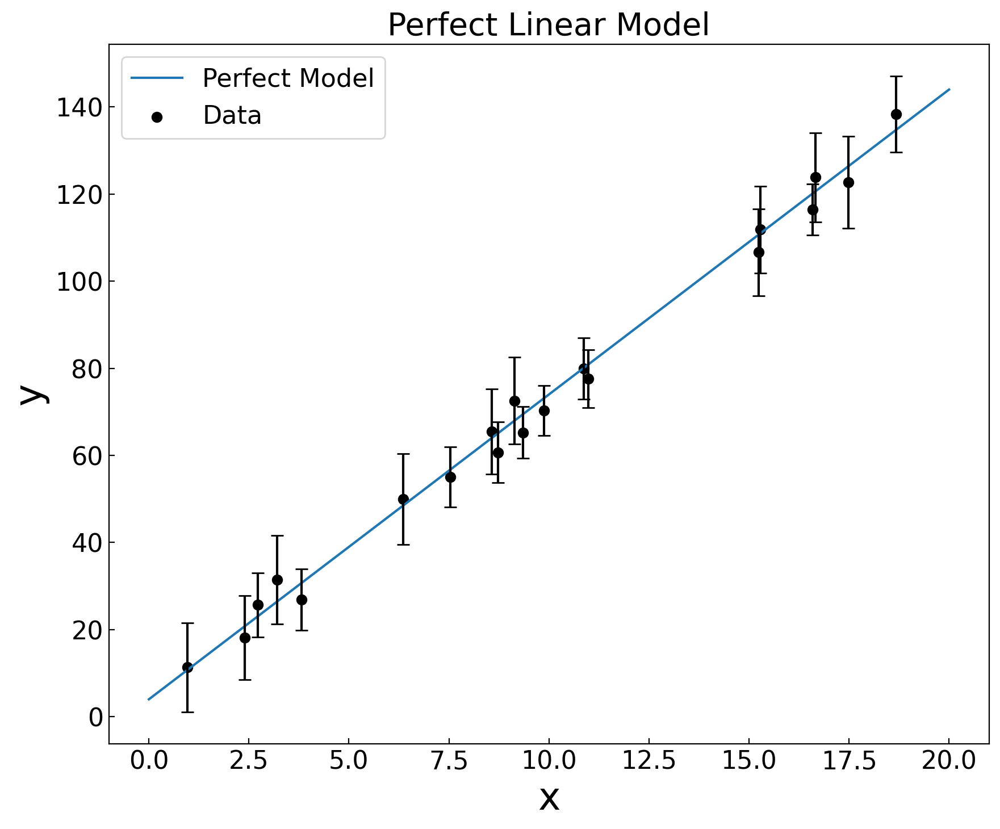

In [17]:
# Defining the linear function

def linear_regression(x, params):

    m = params[0]

    c = params[1]

    return m * x + c


#Ideal parameters for linear fitting we will try to recover with MCMC

m_true = 7

c_true = 4

params_linear_true = np.array([m_true, c_true])


#Use it to create our noisy data
#we'll generate the spread from a uniform distribution and the uncertainty from a normal distribution
#we'll make data for each of our model functions because causing it x_data or just y_data causes some issues
#if you aren't super careful


#LINEAR FUNCTION

#List of random x values for the data

n_linear = 20 #number of data points

x_max_linear = 20 #maximum x value we care about

x_data_linear = x_max_linear * np.random.rand(n_linear)

#sort it, makes tracking the values easier
x_data_linear = np.sort(x_data_linear)

#Make some array for the noise, we'll let it run from negative 10 to positive 10

y_noise_linear = 10 * np.random.rand(len(x_data_linear)) - 5

#y_data = light_curve_double_sine(x_data, params_true) + y_noise

y_data_linear = linear_regression(x_data_linear, params_linear_true) + y_noise_linear

#Make the error from a normal distribution centered on 8 with a std of 2

y_err_linear = abs(np.random.normal(8, 2, n_linear))



#Plotting the perfect model over the data

x_linear = np.linspace(0, x_max_linear, 1000)

plt.figure(figsize = (10,8))
plt.plot(x_linear, linear_regression(x_linear, params_linear_true), label = 'Perfect Model')
plt.title('Perfect Linear Model', fontsize=20)
plt.errorbar(x_data_linear, y_data_linear, yerr = y_err_linear, linestyle = '', capsize = 4, color = 'black')
plt.scatter(x_data_linear, y_data_linear, marker = 'o', color = 'black', label = 'Data')
plt.xlabel('x', fontsize = 24)
plt.ylabel('y', fontsize = 24)
plt.tick_params(direction = 'in', labelsize = 16)
plt.legend(fontsize = 16)
plt.show()


[6.92683443 3.44574386]
The Best Fit for the slope is 6.926834433193801 ± 0.11844925002263014
The Best Fit for the y-intercept is 3.445743862886733 ± 0.6734806119956683
The reduced chi squared for the best fit is 0.15601105189983686


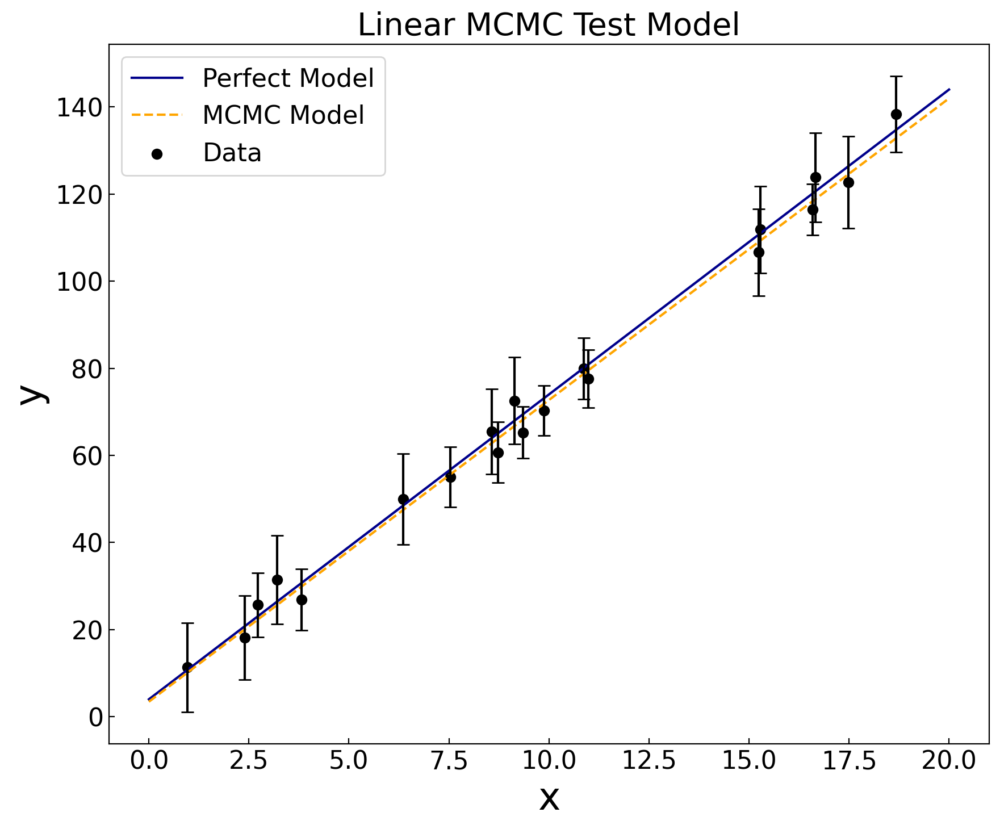

In [18]:
# Linear Function MCMC Test

#initialize the guesses randomly around the correct ones to see if they converge

params_linear_try = np.random.normal(params_linear_true, 0.33 * params_linear_true, (10,2))

prior_linear = [log_flat_prior, log_flat_prior]

MCMC_ideal_parameters_linear, markov_chains_linear, post_std_linear, red_chi2_linear = metropolis_mcmc(x_data_linear, y_data_linear,
                                                                       y_err_linear, linear_regression, log_max_likelihood,
                                                                       prior_linear, gaussian_proposal_func, params_linear_try, 3000, 1000)

print(MCMC_ideal_parameters_linear)


print("The Best Fit for the slope is " + str(MCMC_ideal_parameters_linear[0]) + ' ± ' + str(post_std_linear[0]))

print("The Best Fit for the y-intercept is " + str(MCMC_ideal_parameters_linear[1]) + ' ± ' + str(post_std_linear[1]))

print("The reduced chi squared for the best fit is " + str(red_chi2_linear))


# Plotting the linear MCMC test model results over the perfect model

x_linear = np.linspace(0, x_max_linear, 1000)
y_mcmc_linear = MCMC_ideal_parameters_linear[0]*x_linear + MCMC_ideal_parameters_linear[1]

plt.figure(figsize = (10,8))
plt.title('Linear MCMC Test Model', fontsize=20)
plt.plot(x_linear, linear_regression(x_linear, params_linear_true), label = 'Perfect Model', color='darkblue')
plt.plot(x_linear, y_mcmc_linear, label = 'MCMC Model', linestyle='--', color='orange')
plt.errorbar(x_data_linear, y_data_linear, yerr = y_err_linear, linestyle = '', capsize = 4, color = 'black')
plt.scatter(x_data_linear, y_data_linear, marker = 'o', color = 'black', label = 'Data')
plt.xlabel('x', fontsize = 24)
plt.ylabel('y', fontsize = 24)
plt.tick_params(direction = 'in', labelsize = 16)
plt.legend(fontsize = 16)
plt.show()

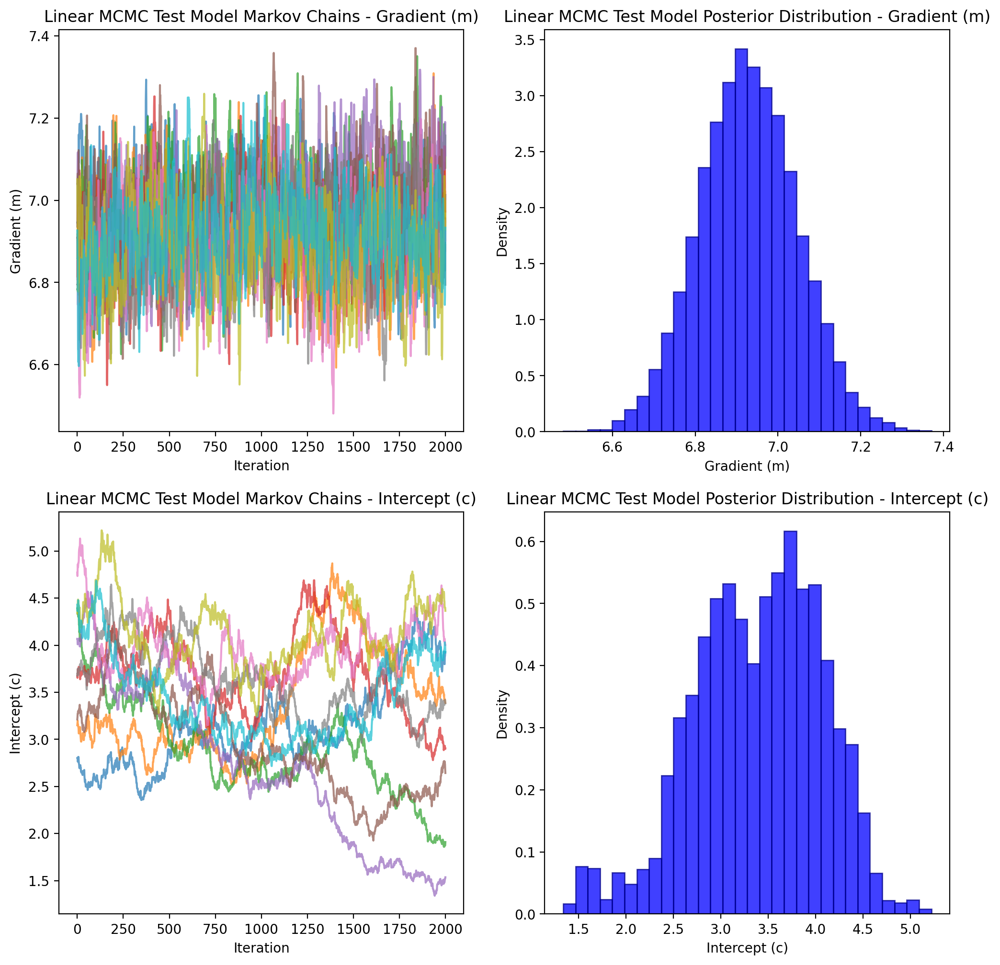

In [19]:
# Plotting the linear MCMC test model posterior and markov chains

num_chains, num_params, num_iterations = markov_chains_linear.shape
param_labels = ['Gradient (m)', 'Intercept (c)']

# Create subplots
fig, axes = plt.subplots(num_params, 2, figsize=(12, 6 * num_params))

for i in range(num_params):
    param_samples = markov_chains_linear[:, i, :].flatten()

    # Plot Markov Chains
    for chain in range(num_chains):
        axes[i, 0].plot(range(num_iterations), markov_chains_linear[chain, i, :], alpha=0.7)
    axes[i, 0].set_title(f'Linear MCMC Test Model Markov Chains - {param_labels[i]}')
    axes[i, 0].set_xlabel('Iteration')
    axes[i, 0].set_ylabel(param_labels[i])

    # Plot Posterior distribution
    axes[i, 1].hist(param_samples, bins=30, alpha=0.75, color='blue', edgecolor='darkblue', density=True)
    axes[i, 1].set_title(f'Linear MCMC Test Model Posterior Distribution - {param_labels[i]}')
    axes[i, 1].set_xlabel(param_labels[i])
    axes[i, 1].set_ylabel('Density')

plt.show()

The posterior seems pretty spread out due to two things, limits on the data and limits on the priors. Of course, with tighter priors we can constrain the parameters around the values we should expect, something we will do for more complex functions later on! We may also have a problem with the data itself. With a small number of points constrained within an order of magnitude there isn't enough information to give a flat prior to constain the model. In this case I'd say collecting data from higher x's would do better to constrain the model better than just taking more data points in the same x range.

### <span style='font-size:large'>Test 2: Quadratic Function</span>



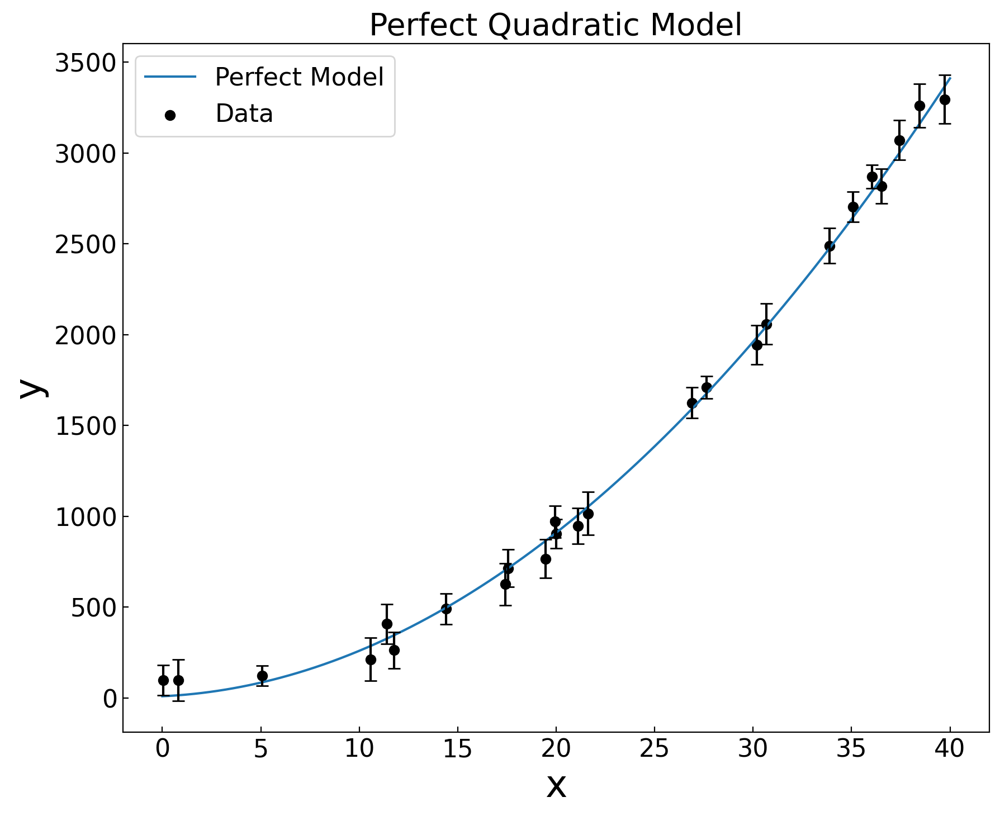

In [20]:
# Defining the quadratic function

def quadratic_regression(x, params):

    a = params[0]

    b = params[1]

    c = params[2]

    return a * x**2 + b * x + c



#Ideal parameters for quadratic fitting we will try to recover with MCMC

a_true = 2

b_true = 5

c_true = 10

params_quadratic_true = np.array([a_true, b_true, c_true])


#QUADRATIC FUNCTION



n_quadratic = 25 #number of data points

x_max_quadratic = 40 #maximum x value we care about

x_data_quadratic = x_max_quadratic * np.random.rand(n_quadratic)


#sort it, makes tracking the values easier
x_data_quadratic = np.sort(x_data_quadratic)


#Make some array for the noise, we'll let it run from negative 10 to positive 10

y_noise_quadratic = 200 * np.random.rand(len(x_data_quadratic)) - 100

#y_data = light_curve_double_sine(x_data, params_true) + y_noise

y_data_quadratic = quadratic_regression(x_data_quadratic, params_quadratic_true) + y_noise_quadratic

#Make the error from a normal distribution centered on 20 with a std of 5

y_err_quadratic = abs(np.random.normal(100, 20, n_quadratic))




plt.figure(figsize = (10,8))

x_quadratic = np.linspace(0, x_max_quadratic, 1000)

plt.plot(x_quadratic, quadratic_regression(x_quadratic, params_quadratic_true), label = 'Perfect Model')
plt.title('Perfect Quadratic Model', fontsize=20)
plt.errorbar(x_data_quadratic, y_data_quadratic, yerr = y_err_quadratic, linestyle = '', capsize = 4, color = 'black')
plt.scatter(x_data_quadratic, y_data_quadratic, marker = 'o', color = 'black', label = 'Data')
plt.xlabel('x', fontsize = 24)
plt.ylabel('y', fontsize = 24)
plt.tick_params(direction = 'in', labelsize = 16)
plt.legend(fontsize = 16)
plt.show()


[ 2.06124661  3.61639389 12.40775747]
The Best Fit for a is 2.0612466103935767 ± 0.04721580217329656
The Best Fit for b is 3.6163938850304733 ± 1.5221408518041009
The Best Fit for c is 12.407757469365725 ± 3.8776985757723
The reduced chi squared for the best fit is 0.4017655215740934


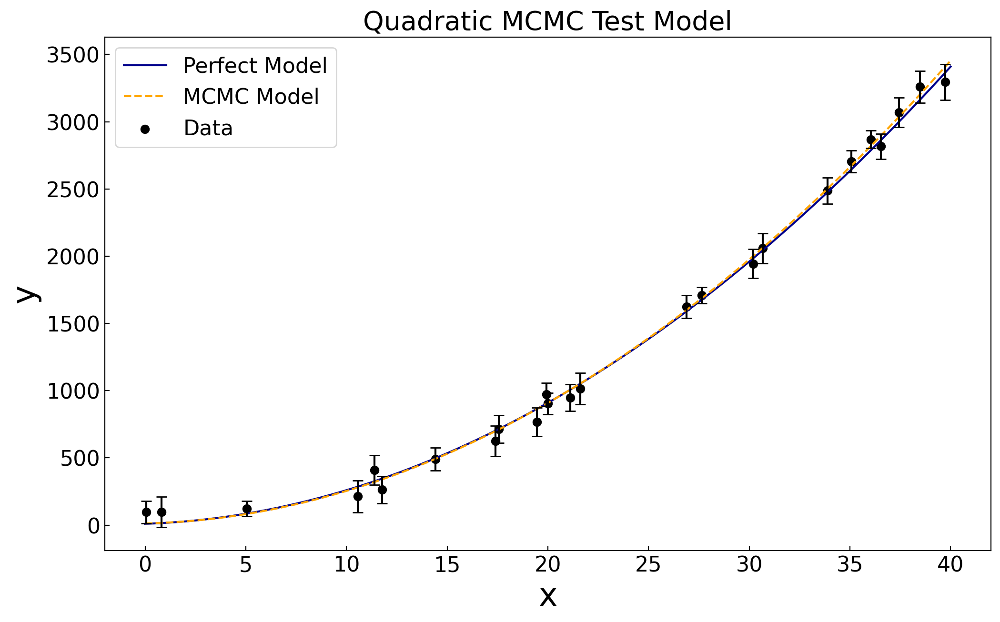

In [21]:
# Quadratic Function MCMC Test

params_quadratic_try = np.random.normal(params_quadratic_true, 0.33 * params_quadratic_true, (8,3))

prior_quadratic = [log_flat_prior, log_flat_prior, log_flat_prior]

MCMC_ideal_parameters_quadratic, markov_chains_quadratic, post_stds_quadratic, red_chi2_quadratic = metropolis_mcmc(x_data_quadratic, y_data_quadratic,
                                                                                   y_err_quadratic, quadratic_regression, log_max_likelihood,
                                                                prior_quadratic, gaussian_proposal_func, params_quadratic_try, 3600, 1000)

print(MCMC_ideal_parameters_quadratic)


# Plotting the quadratic MCMC test model results over the perfect model


print("The Best Fit for a is " + str(MCMC_ideal_parameters_quadratic[0]) + ' ± ' + str(post_stds_quadratic[0]))

print("The Best Fit for b is " + str(MCMC_ideal_parameters_quadratic[1]) + ' ± ' + str(post_stds_quadratic[1]))

print("The Best Fit for c is " + str(MCMC_ideal_parameters_quadratic[2]) + ' ± ' + str(post_stds_quadratic[2]))

print("The reduced chi squared for the best fit is " + str(red_chi2_quadratic))

x_quadratic = np.linspace(0, x_max_quadratic, 1000)
y_mcmc_quadratic = MCMC_ideal_parameters_quadratic[0]*(x_quadratic**(2)) + MCMC_ideal_parameters_quadratic[1]*(x_quadratic) + MCMC_ideal_parameters_quadratic[2]

plt.title('Quadratic MCMC Test Model', fontsize=20)
plt.plot(x_quadratic, quadratic_regression(x_quadratic, params_quadratic_true), label = 'Perfect Model', color='darkblue')
plt.plot(x_quadratic, y_mcmc_quadratic, label = 'MCMC Model', linestyle='--', color='orange')
plt.errorbar(x_data_quadratic, y_data_quadratic, yerr = y_err_quadratic, linestyle = '', capsize = 4, color = 'black')
plt.scatter(x_data_quadratic, y_data_quadratic, marker = 'o', color = 'black', label = 'Data')
plt.xlabel('x', fontsize = 24)
plt.ylabel('y', fontsize = 24)
plt.tick_params(direction = 'in', labelsize = 16)
plt.legend(fontsize = 16)
plt.show()

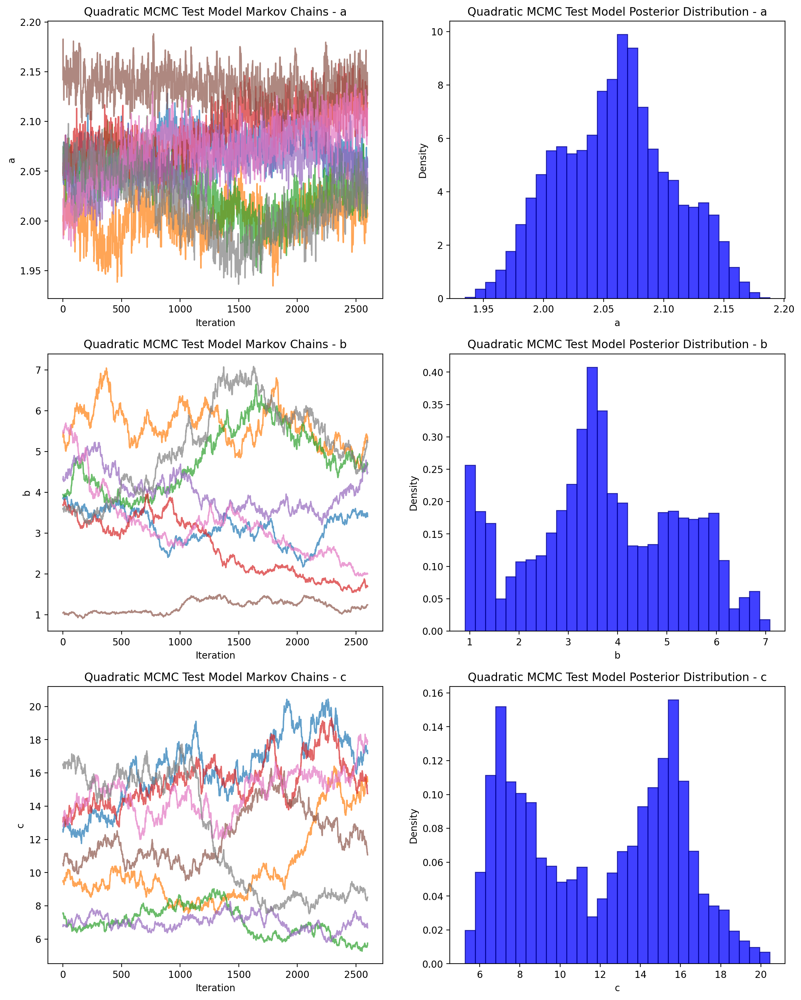

In [22]:
# Plotting the quadratic MCMC test model posterior and markov chains

num_chains, num_params, num_iterations = markov_chains_quadratic.shape
param_labels = ['a', 'b', 'c']

# Create subplots
fig, axes = plt.subplots(num_params, 2, figsize=(14, 6 * num_params))

for i in range(num_params):
    param_samples = markov_chains_quadratic[:, i, :].flatten()

    # Plot Markov Chains
    for chain in range(num_chains):
        axes[i, 0].plot(range(num_iterations), markov_chains_quadratic[chain, i, :], alpha=0.7)
    axes[i, 0].set_title(f'Quadratic MCMC Test Model Markov Chains - {param_labels[i]}')
    axes[i, 0].set_xlabel('Iteration')
    axes[i, 0].set_ylabel(param_labels[i])

    # Plot Posterior distribution
    axes[i, 1].hist(param_samples, bins=30, alpha=0.75, color='blue', edgecolor='darkblue', density=True)
    axes[i, 1].set_title(f'Quadratic MCMC Test Model Posterior Distribution - {param_labels[i]}')
    axes[i, 1].set_xlabel(param_labels[i])
    axes[i, 1].set_ylabel('Density')

plt.show()

## <span style='font-size:large'>Test 3: Double Sine Function</span>



In [29]:
def double_sine(t, params):

    A_1 = params[0]

    omega_1 = params[1]

    A_2 = params[2]

    omega_2 = params[3]

    C = params[4]

    return A_1 * np.sin(omega_1 * t) + A_2 * np.sin(omega_2 * t) + C


#for the double sine equation

A_1_true = 8

omega_1_true = 2*np.pi / 5

A_2_true = 5

omega_2_true = 2*np.pi / 25

C_true = 5

params_double_sine_true = np.array([A_1_true, omega_1_true, A_2_true, omega_2_true, C_true])




#DOUBLE SINE FUNCTION



n_dbl_sine = 240 #number of data points

x_max_dbl_sine = 50 #maximum x value we care about

x_data_dbl_sine = x_max_dbl_sine * np.random.rand(n_dbl_sine)


#sort it, makes tracking the values easier
x_data_dbl_sine = np.sort(x_data_dbl_sine)


#Make some array for the noise, we'll let it run from negative 1.5 to positive 1.5

y_noise_dbl_sine = 3 * np.random.rand(len(x_data_dbl_sine)) - 1.5

#y_data = light_curve_double_sine(x_data, params_true) + y_noise

y_data_dbl_sine = double_sine(x_data_dbl_sine, params_double_sine_true) + y_noise_dbl_sine

#Make the error from a normal distribution centered on 20 with a std of 5

y_err_dbl_sine = abs(np.random.normal(2.5, 1, n_dbl_sine))

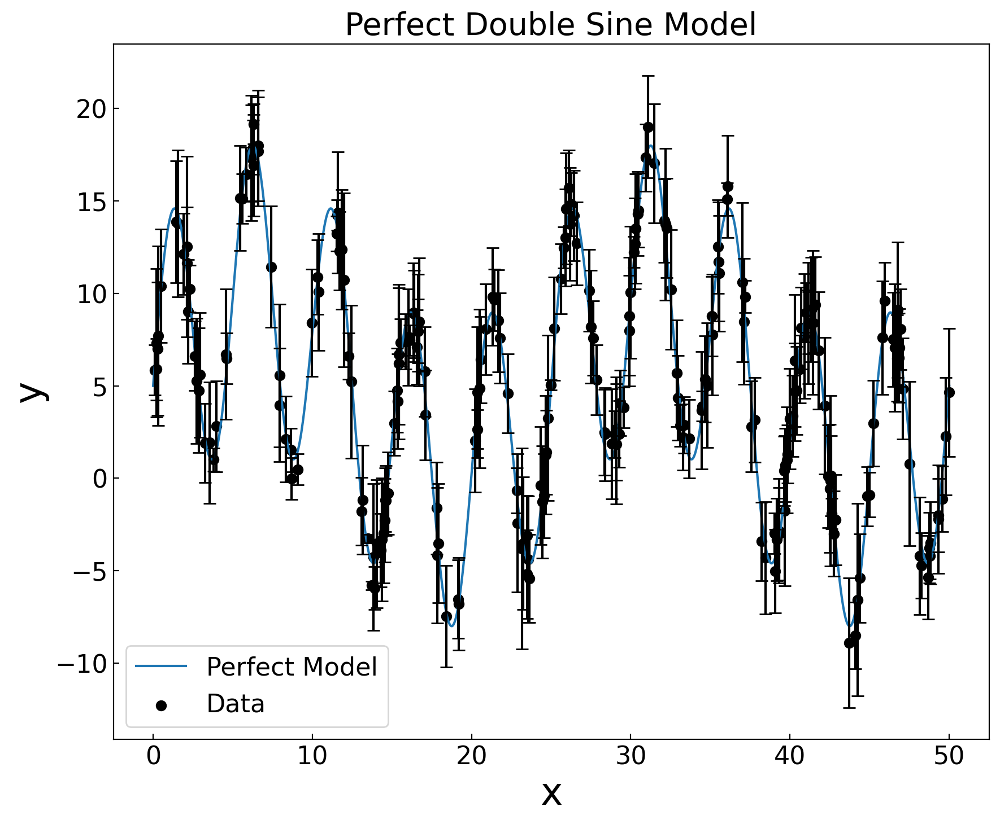

In [30]:
#plot double sine

plt.figure(figsize = (10,8))

x_dbl_sine = np.linspace(0, x_max_dbl_sine, 1000)

plt.plot(x_dbl_sine, double_sine(x_dbl_sine, params_double_sine_true), label = 'Perfect Model')
plt.title('Perfect Double Sine Model', fontsize=20)
plt.errorbar(x_data_dbl_sine, y_data_dbl_sine, yerr = y_err_dbl_sine, linestyle = '', capsize = 4, color = 'black')
plt.scatter(x_data_dbl_sine, y_data_dbl_sine, marker = 'o', color = 'black', label = 'Data')
plt.xlabel('x', fontsize = 24)
plt.ylabel('y', fontsize = 24)
plt.tick_params(direction = 'in', labelsize = 16)
plt.legend(fontsize = 16)
plt.show()

[8.1865599  1.25674676 5.25430123 0.25120987 4.92855583]
The Best Fit for A_1 is 8.186559899213776 ± 0.08852058768708698
The Best Fit for ω_1 is 1.2567467617083539 ± 0.00046635046630695185
The Best Fit for Α_2 is 5.25430122856337 ± 0.11746574743136518
The Best Fit for ω_2 is 0.25120986581661814 ± 0.000666953524234847
The Best Fit for C is 4.928555829690871 ± 0.06758025957845264
The reduced chi squared for the best fit is 0.32225936456974724


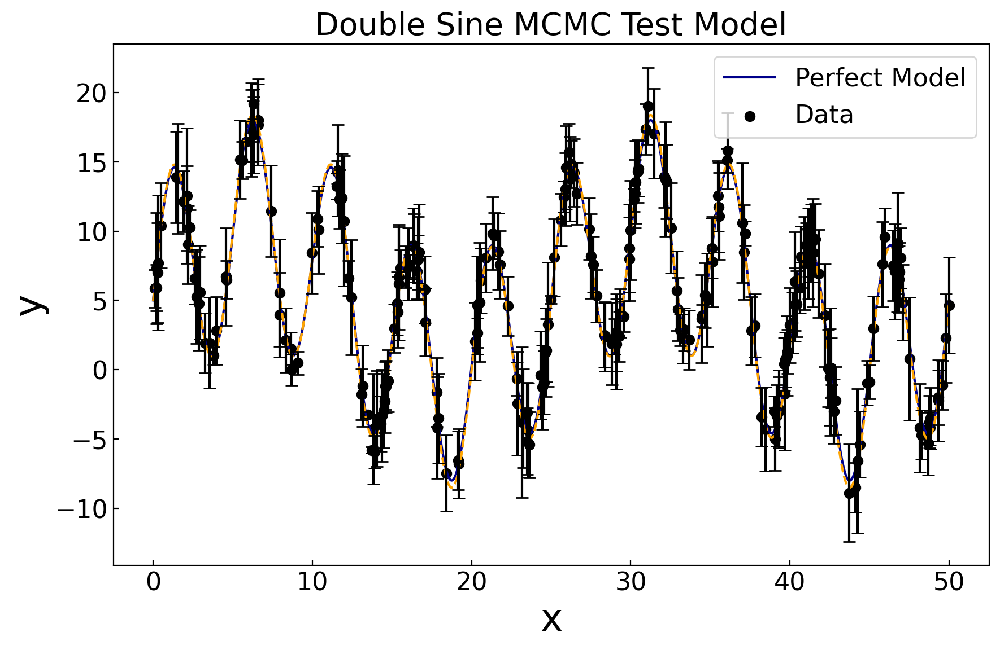

In [31]:
# Double Sine MCMC Test

prior_dbl_sine = [log_flat_prior, log_flat_prior, log_flat_prior, log_flat_prior, log_flat_prior]

params_double_sine_try = np.random.normal(params_double_sine_true, 0.1 * params_double_sine_true, (10,5))

MCMC_ideal_parameters_dbl_sine, markov_chains_dbl_sine, post_stds_dbl_sine, red_chi2_dbl_sine = metropolis_mcmc(x_data_dbl_sine, y_data_dbl_sine,
                                                                         y_err_dbl_sine, double_sine, log_max_likelihood,
                                                                         prior_dbl_sine, gaussian_proposal_func, params_double_sine_try, 30000, 2000)

print(MCMC_ideal_parameters_dbl_sine)


# Plotting the double sine MCMC test model results over the perfect model

print("The Best Fit for A_1 is " + str(MCMC_ideal_parameters_dbl_sine[0]) + ' ± ' + str(post_stds_dbl_sine[0]))

print("The Best Fit for ω_1 is " + str(MCMC_ideal_parameters_dbl_sine[1]) + ' ± ' + str(post_stds_dbl_sine[1]))

print("The Best Fit for Α_2 is " + str(MCMC_ideal_parameters_dbl_sine[2]) + ' ± ' + str(post_stds_dbl_sine[2]))

print("The Best Fit for ω_2 is " + str(MCMC_ideal_parameters_dbl_sine[3]) + ' ± ' + str(post_stds_dbl_sine[3]))

print("The Best Fit for C is " + str(MCMC_ideal_parameters_dbl_sine[4]) + ' ± ' + str(post_stds_dbl_sine[4]))

print("The reduced chi squared for the best fit is " + str(red_chi2_dbl_sine))



plt.figure(figsize = (10,6))

x_dbl_sine = np.linspace(0, x_max_dbl_sine, 1000)                                                       
y_mcmc_dbl_sine = double_sine(x_dbl_sine, MCMC_ideal_parameters_dbl_sine)

plt.plot(x_dbl_sine, double_sine(x_dbl_sine, params_double_sine_true), label = 'Perfect Model', color='darkblue')
plt.plot(x_dbl_sine, y_mcmc_dbl_sine, linestyle='--', color='orange')
plt.title('Double Sine MCMC Test Model', fontsize=20)
plt.errorbar(x_data_dbl_sine, y_data_dbl_sine, yerr = y_err_dbl_sine, linestyle = '', capsize = 4, color = 'black')
plt.scatter(x_data_dbl_sine, y_data_dbl_sine, marker = 'o', color = 'black', label = 'Data')
plt.xlabel('x', fontsize = 24)
plt.ylabel('y', fontsize = 24)
plt.tick_params(direction = 'in', labelsize = 16)
plt.legend(fontsize = 16)
plt.show()

When including the uncertainty the parameters ofbest fit are in good agreement with the true values! They aren't super tight but then again our data has pretty large error (by design, we'll admit). Let's move to the posteriors themselves.

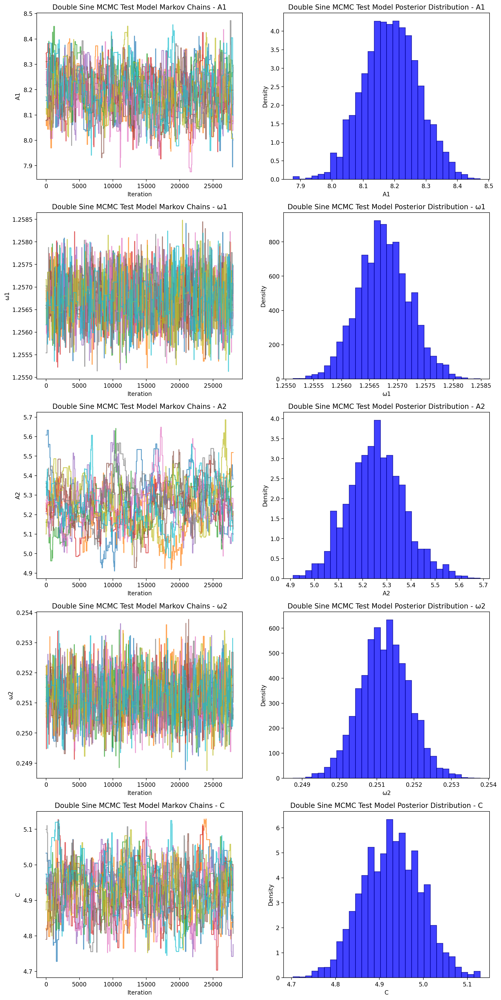

In [32]:
# Plotting the quadratic MCMC test model posterior and markov chains

num_chains, num_params, num_iterations = markov_chains_dbl_sine.shape
param_labels = ['A1', 'ω1', 'Α2', "ω2", 'C']

# Create subplots
fig, axes = plt.subplots(num_params, 2, figsize=(14, 6 * num_params))

for i in range(num_params):
    param_samples = markov_chains_dbl_sine[:, i, :].flatten()

    # Plot Markov Chains
    for chain in range(num_chains):
        axes[i, 0].plot(range(num_iterations), markov_chains_dbl_sine[chain, i, :], alpha=0.7)
    axes[i, 0].set_title(f'Double Sine MCMC Test Model Markov Chains - {param_labels[i]}')
    axes[i, 0].set_xlabel('Iteration')
    axes[i, 0].set_ylabel(param_labels[i])

    # Plot Posterior distribution
    axes[i, 1].hist(param_samples, bins=30, alpha=0.75, color='blue', edgecolor='darkblue', density=True)
    axes[i, 1].set_title(f'Double Sine MCMC Test Model Posterior Distribution - {param_labels[i]}')
    axes[i, 1].set_xlabel(param_labels[i])
    axes[i, 1].set_ylabel('Density')

plt.show()

We've noticed based on the random data produced the chains often branch to separate values for the posterior. Nonetheless, when we take the median value the fit looks pretty good. However, maybe we can use a different prior ro constraint the posterior to only have one peak. This demonstrates a massive advantage of using multiple chains in our MCMC, even if one or more deviates from the true value on average the collection of chains will constrain the true results. It's similar to the wisdom of the crowd in estiamting the number of jelly beans in a jar.


### Alternate Prior

Let's try to use this above posterior as a prior to see if we get tighter constraints on the parameters.

To do this we need to return our full posterior, not just the ideal values. We want to plug in the relative occurrence of the parameters of the double sine in our Markov chains. The ideal is that our chain just struggles from staring from flat priors and needs a bit more guidance for more complex model. A more complete way of saying that is that what the code is trying to simply reduce a mathematical equation in the form of a maximum likelihood (assuming a flat prior) and there isn't enough incentive for the MCMC to try to fit the very high and low points with large error bars as there is simply fitting all the middle points clustered around y = 0 to y = 5 to a sine with a much smaller amplitude.

The way I like to picture the prior in these settings is as the carrot and the stick. We "reward" the code for searching around the values we want with higher posteriors and "punish" the code with very low posteriors when it deviates from the values we want. In this case we can see the code is struggling getting the amplitudes right so we can use our better judgement to set the priors by estimating the parameters by eye. This must be done with caution though as we don't want to walk ourselves into a corner but not being flexible with our assumptions that could be wrong.

We'll take the posterior, bin them in a normalized histogram, and then interpolate that to get the PDF for any point in the posterior space. For any parameter outside of it we'll just set the prior to 0.

In [33]:
##Turn our markov chains into 5 arrays, one containing all the values for each parameter

dbl_sine_posterior_pdf = np.zeros((5, 15))

dbl_sine_bins = np.zeros((5, 16))

dbl_sine_interpolated_pdfs = []

for i in range(num_params):
    
    dbl_sine_posterior_pdf[i], dbl_sine_bins[i] = np.histogram(markov_chains_dbl_sine[:, i, :].flatten(),  density = True, bins = 15)
    
    
    #interpolate pdfs


    dbl_sine_interpolated_pdfs.append(scipy.interpolate.interp1d(dbl_sine_bins[i][0:15], dbl_sine_posterior_pdf[i]))


    
def prior_A_1(param):
    
    if param < dbl_sine_bins[0][0]:
        
        return 0
    
    
    if param > dbl_sine_bins[0][14]:
        
        return 0
    

    else:
        
        prior = dbl_sine_interpolated_pdfs[0](param)
    
    return prior



    
def prior_omega_1(param):

    if param < dbl_sine_bins[1][0]:
        
        return 0
    
    if param > dbl_sine_bins[1][14]:
        
        return 0
    

    else:
        
        prior = dbl_sine_interpolated_pdfs[1](param)
    
    return prior



    
def prior_A_2(param):

    if param < dbl_sine_bins[2][0]:
        
        return 0
    
    if param > dbl_sine_bins[2][14]:
        
        return 0
    

    else:
        
        prior = dbl_sine_interpolated_pdfs[2](param)
    
    return prior




    
def prior_omega_2(param):

    if param < dbl_sine_bins[3][0]:
        
        return 0
    
    if param > dbl_sine_bins[3][14]:
        
        return 0
    

    else:
        
        prior = dbl_sine_interpolated_pdfs[3](param)
    
    return prior




    
def prior_C(param):

    if param < dbl_sine_bins[4][0]:
        
        return 0
        
        
    if param > dbl_sine_bins[4][14]:
        
        return 0
    

    else:
        
        prior = dbl_sine_interpolated_pdfs[4](param)
    
    
    return prior



[8.         1.25663706 5.         0.25132741 5.        ]


[8.1865599  1.25674676 5.25430123 0.25120987 4.92855583]
The Best Fit for A_1 is 8.186559899213776 ± 0.08852058768708698
The Best Fit for ω_1 is 1.2567467617083539 ± 0.00046635046630695185
The Best Fit for Α_2 is 5.25430122856337 ± 0.11746574743136518
The Best Fit for ω_2 is 0.25120986581661814 ± 0.000666953524234847
The Best Fit for C is 4.928555829690871 ± 0.06758025957845264
The reduced chi squared for the best fit is 0.32225936456974724


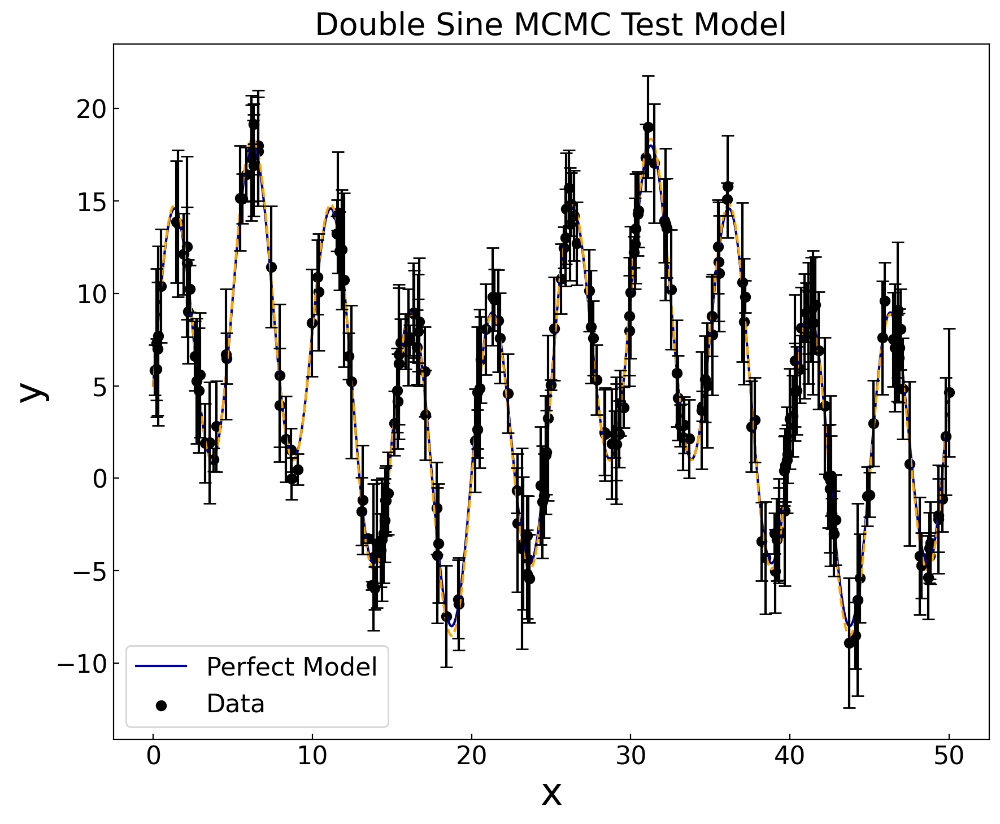

In [34]:
prior_dbl_sine = [prior_A_1, prior_omega_1, prior_A_2, prior_omega_2, prior_C]

params_double_sine_try = np.random.normal(params_double_sine_true, 0.1 * params_double_sine_true, (10,5))


print(params_double_sine_true)


MCMC_best_values, markov_chain_double_sine, double_sine_std, double_sine_red_chi2 = metropolis_mcmc(x_data_dbl_sine,
                                                             y_data_dbl_sine, y_err_dbl_sine, double_sine,
                                                             log_max_likelihood, prior_dbl_sine, gaussian_proposal_func,
                                                             params_double_sine_try, 30000, 1000)
print(MCMC_ideal_parameters_dbl_sine)


# Plotting the double sine MCMC test model results over the perfect model

print("The Best Fit for A_1 is " + str(MCMC_ideal_parameters_dbl_sine[0]) + ' ± ' + str(post_stds_dbl_sine[0]))

print("The Best Fit for ω_1 is " + str(MCMC_ideal_parameters_dbl_sine[1]) + ' ± ' + str(post_stds_dbl_sine[1]))

print("The Best Fit for Α_2 is " + str(MCMC_ideal_parameters_dbl_sine[2]) + ' ± ' + str(post_stds_dbl_sine[2]))

print("The Best Fit for ω_2 is " + str(MCMC_ideal_parameters_dbl_sine[3]) + ' ± ' + str(post_stds_dbl_sine[3]))

print("The Best Fit for C is " + str(MCMC_ideal_parameters_dbl_sine[4]) + ' ± ' + str(post_stds_dbl_sine[4]))

print("The reduced chi squared for the best fit is " + str(red_chi2_dbl_sine))


# Plotting the double sine MCMC test model results over the perfect model

plt.figure(figsize = (10,8))

x_dbl_sine = np.linspace(0, x_max_dbl_sine, 1000)                                                       
y_mcmc_dbl_sine = double_sine(x_dbl_sine, MCMC_ideal_parameters_dbl_sine)

plt.plot(x_dbl_sine, double_sine(x_dbl_sine, params_double_sine_true), label = 'Perfect Model', color='darkblue')
plt.plot(x_dbl_sine, y_mcmc_dbl_sine, linestyle='--', color='orange')
plt.title('Double Sine MCMC Test Model', fontsize=20)
plt.errorbar(x_data_dbl_sine, y_data_dbl_sine, yerr = y_err_dbl_sine, linestyle = '', capsize = 4, color = 'black')
plt.scatter(x_data_dbl_sine, y_data_dbl_sine, marker = 'o', color = 'black', label = 'Data')
plt.xlabel('x', fontsize = 24)
plt.ylabel('y', fontsize = 24)
plt.tick_params(direction = 'in', labelsize = 16)
plt.legend(fontsize = 16)
plt.show()

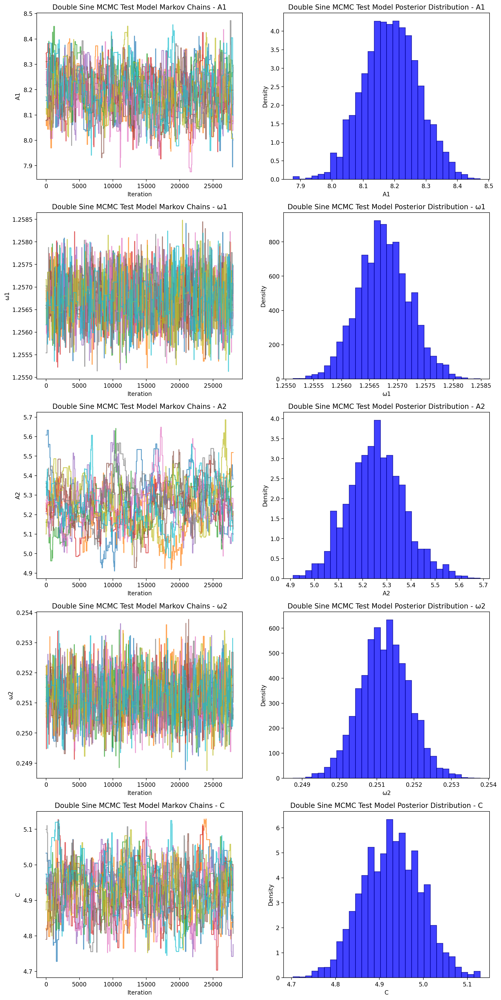

In [35]:
# Plotting the quadratic MCMC test model posterior and markov chains

num_chains, num_params, num_iterations = markov_chains_dbl_sine.shape
param_labels = ['A1', 'ω1', 'Α2', "ω2", 'C']

# Create subplots
fig, axes = plt.subplots(num_params, 2, figsize=(14, 6 * num_params))

for i in range(num_params):
    param_samples = markov_chains_dbl_sine[:, i, :].flatten()

    # Plot Markov Chains
    for chain in range(num_chains):
        axes[i, 0].plot(range(num_iterations), markov_chains_dbl_sine[chain, i, :], alpha=0.7)
    axes[i, 0].set_title(f'Double Sine MCMC Test Model Markov Chains - {param_labels[i]}')
    axes[i, 0].set_xlabel('Iteration')
    axes[i, 0].set_ylabel(param_labels[i])

    # Plot Posterior distribution
    axes[i, 1].hist(param_samples, bins=30, alpha=0.75, color='blue', edgecolor='darkblue', density=True)
    axes[i, 1].set_title(f'Double Sine MCMC Test Model Posterior Distribution - {param_labels[i]}')
    axes[i, 1].set_xlabel(param_labels[i])
    axes[i, 1].set_ylabel('Density')

plt.show()

### New Proposal Function

With the double sine we usually find the result of plugging in the posterior as the prior does resolve the issue of multiple peaks nor does it tighten the posterior. Occasionally we see chains jump from the local maxima around one of the lower peaks to the true maximum but not all the time. There are two ways we can resolve this: we can add random large jumps to explore more of parameter space or we can make tighter priors around the true values. Later on in this code we'll do the latter so let's play a little bit with the proposal fucntion. We'll have mostly the same behavior but every time it's called we'll generate a random number. About 0.5% of the time we'll have the proposal function pull from a much wider gaussian to cause the chain to consider wider values.

[8.1865599  1.25674676 5.25430123 0.25120987 4.92855583]
The Best Fit for A_1 is 8.186559899213776 ± 0.08852058768708698
The Best Fit for ω_1 is 1.2567467617083539 ± 0.00046635046630695185
The Best Fit for Α_2 is 5.25430122856337 ± 0.11746574743136518
The Best Fit for ω_2 is 0.25120986581661814 ± 0.000666953524234847
The Best Fit for C is 4.928555829690871 ± 0.06758025957845264
The reduced chi squared for the best fit is 0.32225936456974724


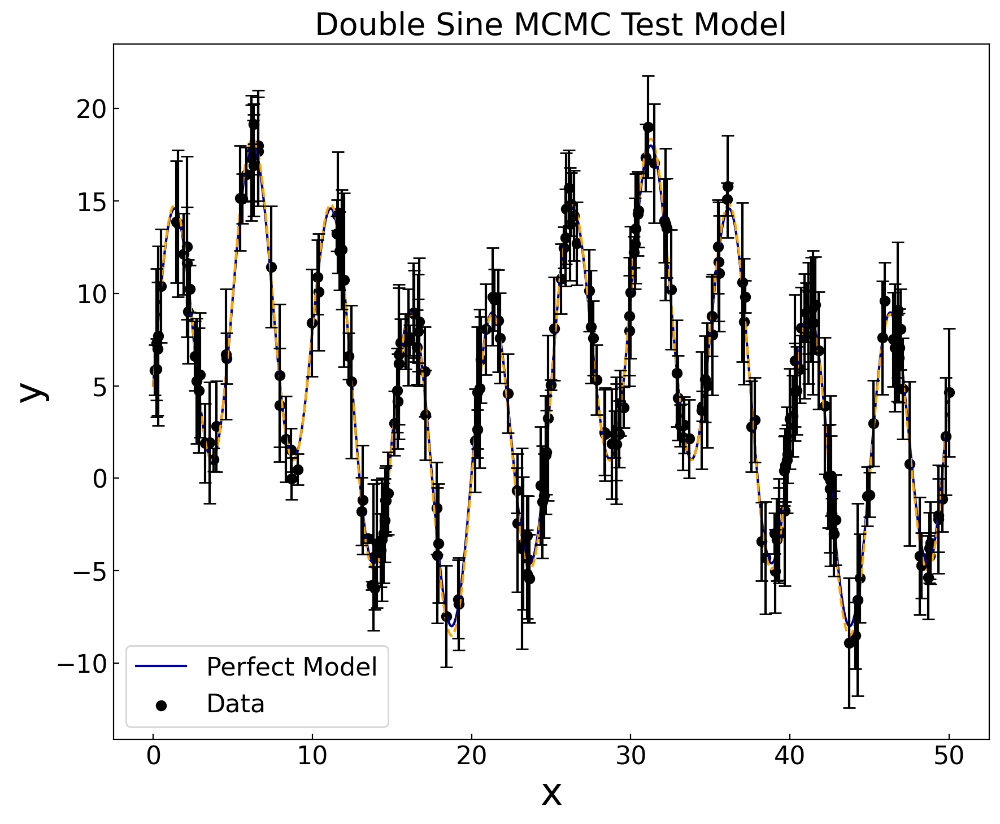

In [36]:
def random_jump_proposal_func(params):
    
    if np.random.rand() < 0.01:
        
        jump = np.random.normal(params,  0.5 * abs(params))
    
    else:
        jump = np.random.normal(params, 1e-3 * abs(params))
    
    return jump
    
    
prior_dbl_sine = [log_flat_prior, log_flat_prior, log_flat_prior, log_flat_prior, log_flat_prior]

    
params_double_sine_try = np.random.normal(params_double_sine_true, 0.1 * params_double_sine_true, (10,5))



MCMC_best_values, markov_chain_double_sine, double_sine_std, double_sine_red_chi2 = metropolis_mcmc(x_data_dbl_sine,
                                                             y_data_dbl_sine, y_err_dbl_sine, double_sine,
                                                             log_max_likelihood, prior_dbl_sine, random_jump_proposal_func,
                                                             params_double_sine_try, 30000, 1000)
print(MCMC_ideal_parameters_dbl_sine)


# Plotting the double sine MCMC test model results over the perfect model

print("The Best Fit for A_1 is " + str(MCMC_ideal_parameters_dbl_sine[0]) + ' ± ' + str(post_stds_dbl_sine[0]))

print("The Best Fit for ω_1 is " + str(MCMC_ideal_parameters_dbl_sine[1]) + ' ± ' + str(post_stds_dbl_sine[1]))

print("The Best Fit for Α_2 is " + str(MCMC_ideal_parameters_dbl_sine[2]) + ' ± ' + str(post_stds_dbl_sine[2]))

print("The Best Fit for ω_2 is " + str(MCMC_ideal_parameters_dbl_sine[3]) + ' ± ' + str(post_stds_dbl_sine[3]))

print("The Best Fit for C is " + str(MCMC_ideal_parameters_dbl_sine[4]) + ' ± ' + str(post_stds_dbl_sine[4]))

print("The reduced chi squared for the best fit is " + str(red_chi2_dbl_sine))


# Plotting the double sine MCMC test model results over the perfect model

plt.figure(figsize = (10,8))

x_dbl_sine = np.linspace(0, x_max_dbl_sine, 1000)                                                       
y_mcmc_dbl_sine = double_sine(x_dbl_sine, MCMC_ideal_parameters_dbl_sine)

plt.plot(x_dbl_sine, double_sine(x_dbl_sine, params_double_sine_true), label = 'Perfect Model', color='darkblue')
plt.plot(x_dbl_sine, y_mcmc_dbl_sine, linestyle='--', color='orange')
plt.title('Double Sine MCMC Test Model', fontsize=20)
plt.errorbar(x_data_dbl_sine, y_data_dbl_sine, yerr = y_err_dbl_sine, linestyle = '', capsize = 4, color = 'black')
plt.scatter(x_data_dbl_sine, y_data_dbl_sine, marker = 'o', color = 'black', label = 'Data')
plt.xlabel('x', fontsize = 24)
plt.ylabel('y', fontsize = 24)
plt.tick_params(direction = 'in', labelsize = 16)
plt.legend(fontsize = 16)
plt.show()

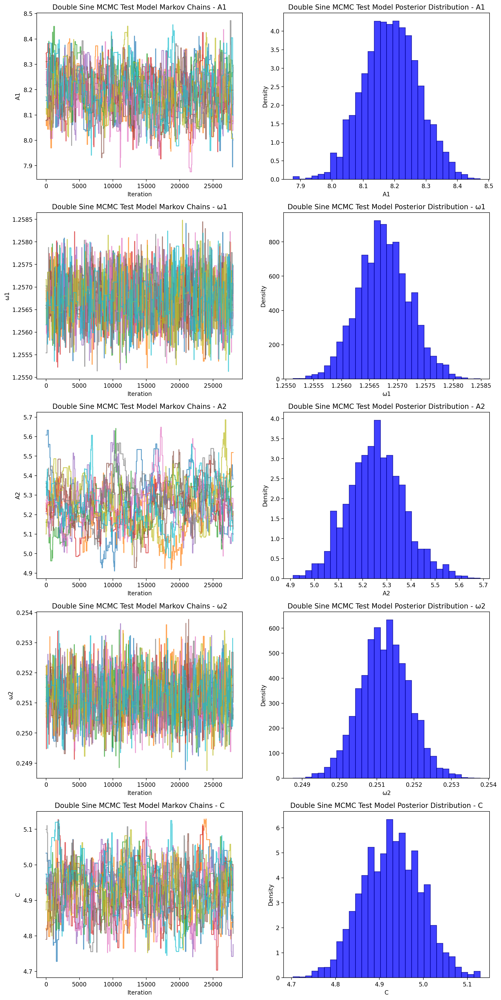

In [37]:
# Plotting the quadratic MCMC test model posterior and markov chains

num_chains, num_params, num_iterations = markov_chains_dbl_sine.shape
param_labels = ['A1', 'ω1', 'Α2', "ω2", 'C']

# Create subplots
fig, axes = plt.subplots(num_params, 2, figsize=(14, 6 * num_params))

for i in range(num_params):
    param_samples = markov_chains_dbl_sine[:, i, :].flatten()

    # Plot Markov Chains
    for chain in range(num_chains):
        axes[i, 0].plot(range(num_iterations), markov_chains_dbl_sine[chain, i, :], alpha=0.7)
    axes[i, 0].set_title(f'Double Sine MCMC Test Model Markov Chains - {param_labels[i]}')
    axes[i, 0].set_xlabel('Iteration')
    axes[i, 0].set_ylabel(param_labels[i])

    # Plot Posterior distribution
    axes[i, 1].hist(param_samples, bins=30, alpha=0.75, color='blue', edgecolor='darkblue', density=True)
    axes[i, 1].set_title(f'Double Sine MCMC Test Model Posterior Distribution - {param_labels[i]}')
    axes[i, 1].set_xlabel(param_labels[i])
    axes[i, 1].set_ylabel('Density')

plt.show()

In most instances of running this code we find this new proposal system to be effective in causing more of the branched chains to jump to the true maximum and at least lower the peaks of the other local maxima if not destroy them completely. We've tested with longer runs of 50,000 iterations and they keep converging but after 200,000 iterations they stop jumping around and stay stable with very low local maxima for one or two chains. Irregardless we find the random big jump method to be fairly effective in getting groups of chains out of a local maxima for MCMCs with many chains.

<span style='font-size:xx-large'>6 ASTRONOMY DATA APPLICATION</span>



<span style='font-size:small'>In order to test our MCMC we are going to apply it to the super interesting and important astronomy application of galactic spectra fitting.</span>

<span style='font-size:medium'>**GALACTIC SPECTRA OVERVIEW:**</span>

<span style='font-size:small'>Before we begin, we thought it would be important to cover what galactic spectra actually are and why they matter. Galactic spectra are key pieces of astronomical data that provide crucial details about a galaxy's composition, motion, and physical properties. The spectra of different galaxies vary depending on factors such as the galaxy's stellar populations, interstellar medium composition, evolutionary state, and kinematics. Galactic spectra come in three different types, </span><span style='font-size:small'>**absorption spectra**</span><span style='font-size:small'>, </span><span style='font-size:small'>**emission spectra**</span><span style='font-size:small'>, and </span><span style='font-size:small'>**continuous spectra**</span><span style='font-size:small'>, however, we will just be exploring galactic emission spectra for our MCMC application. </span>

<span style='font-size:small'>**Emission spectra**</span><span style='font-size:small'> are found in galaxies with active star forming regions, and arise due to the young, hot stars heating the surrounding gas and this ionised gas emitting light at characteristic wavelengths. A galactic emission spectra might look something like this: </span>

<img src="https://cocalc.com/blobs/paste-0.872469369340656?uuid=84c5684d-8e9a-4494-b180-f558bd829500"   width="428px"  height="257px"  style="object-fit:cover"/>

<span style='font-size:x-small'>IMAGE SOURCE: </span>[<span style='font-size:x-small'>https://www.open.edu/openlearn/science\-maths\-technology/introduction\-active\-galaxies/content\-section\-2.3.2/?printable=1</span>](https://www.open.edu/openlearn/science-maths-technology/introduction-active-galaxies/content-section-2.3.2/?printable=1)<span style='font-size:small'> </span>

<span style='font-size:small'>The strength, width, and red\-shifted wavelength of these emission lines can reveal to us the chemical composition, kinematics and even distance of the galaxy!</span>


There are two key quantities in dissecting spectra of star forming galaxies. One is the redshift which tells us the distance and lookback time allowing us to figure out when in cosmic history we are seeing this galaxy. Secondly is strenght of Hα which when paired with the redshift (to find distance)can be used to calculate the star formation rate (SFR) of a galaxy, the total amount of gas a galaxy turns into stellar mass in a given year. Isolating these two parameters of any galaxy with a high level of precision is highly valuable is exactly what we aim to do here.

Below we unpack galaxy 2MASX J08520853+5118462 taken from the Mapping Nearby Galaxies (MaNGa) survey from the Apache Point Observatory (APO). The MaNGa project is a wonderful feat of spatially resolving the spectra of many local galaxies to show how dynamic and varied the physical processes occurring in each galaxy is. Each galaxy is broken into multiple circular spatial pixels (spaxels) which are each about 2 arcseconds across. 

![](https://cocalc.com/blobs/paste-0.10408405346085314?uuid=21b0d299-79bc-4a8e-9ad1-95a7c8d67319)

Each spaxel has its own spectrum (flux versus wavelength). Flux is given in really strange units: $10^{−17} \text{erg} * \text{s}^{−1} \text{cm}^{−2} \text{Angstrom}^{−1} \text{spaxel}^{−1}$, but I have been tearing my hair out trying to put that in a plot in CoCalc to no success so I'll just state that here and leave the y-axis labeled 'Flux'. It's really not that big a deal anyways, the flux can have arbitrary units so long as they don't change when we do our analysis, we aren't actually converting our flux to SFR. Because the galaxy isn't seen face on the measured redshift of each spaxel ought to be slightly different depending on whether that part of the galactic disk is rotating towards or away from us. This provides a sligth challenge in trying to characterize each spaxel as they will each have different redshifts and line strengths depending on the SFR in a specific spaxel. First we'll pull out one specific spaxel with coordinates 35, 30 and try to fit it. With that done we'll show how to generalize this process to work for any spaxel, irregardless of line strength, continuum strength, or redshift.

We obviouslty can't fit the ENTIRE spectrum, we'd need a supercomputer for that. Instead, we'll zoom in around the Hα line to fit that. To flex a little and make this a bit more robust we'll also fit two lines really close to Hα which are two forbidden [NII] lines which we'll just call [NII]a and [NII]b. Those aren't their actual names ($[NII]_{6550}$ and $[NII]_{6585}$ are), but we'll give them more simple names.


First, we'll unpack the data.

In [49]:
Manga_lincube = astro.fits.open('manga-8244-12704-LINCUBE.fits')

print(type(Manga_lincube))

Red_SNR= Manga_lincube[0].header['REDSN2']
Blue_SNR=Manga_lincube[0].header['BLUESN2']


<class 'astropy.io.fits.hdu.hdulist.HDUList'>


Now, we'll try to fit the spectrum of a spaxel with coordinates (35, 30). I chose this one because it should be closer to the center so I imagine the spectrum will be cleaner and well behaved making fitting a little bit easier. In a second we'll generalize our code to work for any spaxel even if it's not super clean. It'll work so long as you don't use a spaxel on the edge which likely captures only a little bit of the galaxy and is very noisy.

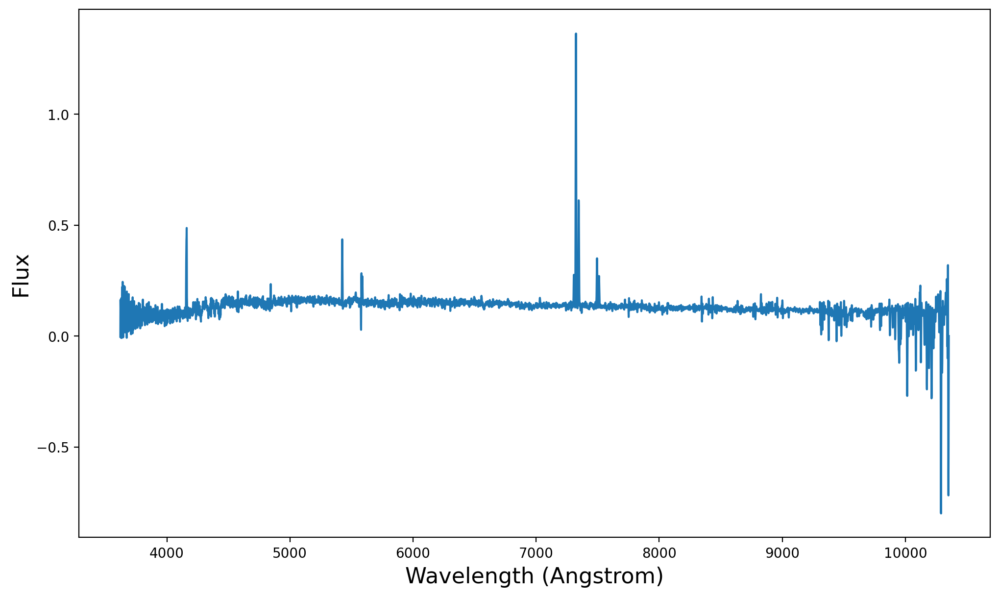

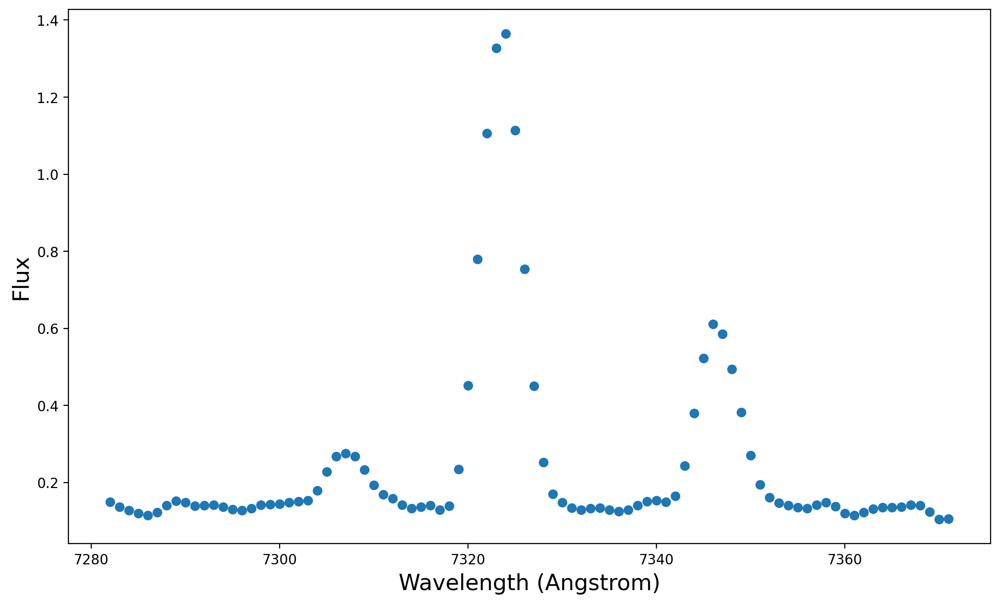

In [50]:
Manga_lincube[1].data[:, 35, 30]
#each spaxel has a 2d array of 

spectra_35_30 = Manga_lincube[1].data[:, 35, 30]

wavelength = np.linspace(3622, 10353, 6732)


plt.plot(wavelength, spectra_35_30)
plt.xlabel('Wavelength (Angstrom)', fontsize = 16)
plt.ylabel(r'Flux', fontsize = 16)
plt.show()


#zoom in on region around H-alpha

wavelength_window = wavelength[3660:3750]

spectra_35_30_window = spectra_35_30[3660:3750]


plt.scatter(wavelength_window, spectra_35_30_window)
plt.xlabel('Wavelength (Angstrom)', fontsize = 16)
plt.ylabel(r'Flux', fontsize = 16)
plt.show()

## OKAY, Let's Do This!

So now we need to fit a model to the above data (the scatter points). Our model will be a series of three gaussian curves representing each emission line we are trying to fit: [NII]a, Hα, and [NII]b. We'll have to add the flux of the continuum as well. The function will have the form:

$F = C + A_{H \alpha} e^{-(\lambda_{obs} - \lambda_{H\alpha}(1 + z))^2/{2\sigma}^2} +  A_{[NII]_a} e^{-(\lambda_{obs} - \lambda_{[NII]_a}(1 + z))^2/{2\sigma}^2} +  A_{[NII]_b} e^{-(\lambda_{obs} - \lambda_{[NII]_b}(1 + z))^2/{2\sigma}^2}$

We see $\lambda_{obs}$ is the free parameter of wavelength and the crazy exponential components are the guassian curves with a mean of the rest wavelengths of the features shifted to the observed frame due to the redshift of the galaxy and a coefficient equal to the strength of the line in units of flux. The coefficient in front of the Hα term will be the one to tell us the SFR. There is also the value σ which is the width of the lines, which to the best of my viewing is consistently around 2.5 angstroms so we'll just set that to take a little bit of load off the code to fit it. Because the rest wavelengths of Hα and the two [NII] lines are constants there are five parameters which need to be fit in each spaxel: redshift (z), continuum strength (C), and the amplitudes of the three emission lines ($Α_{Η_\alpha}, A_{[NII]a}, A_{[NII]b})$.

One last fun part! As we saw above with the double sine function MCMCs struggle with complex functions with lots of points. To give it guidance we need to feed in really good initial values and good priors to make sure the chains don't get off track.

/tmp/ipykernel_227/2719321793.py:137: RuntimeWarning: invalid value encountered in sqrt
  spectra_err = np.std(continuum_35_30_window) * np.sqrt(spectra_35_30) / np.sqrt(np.median(continuum_35_30_window))


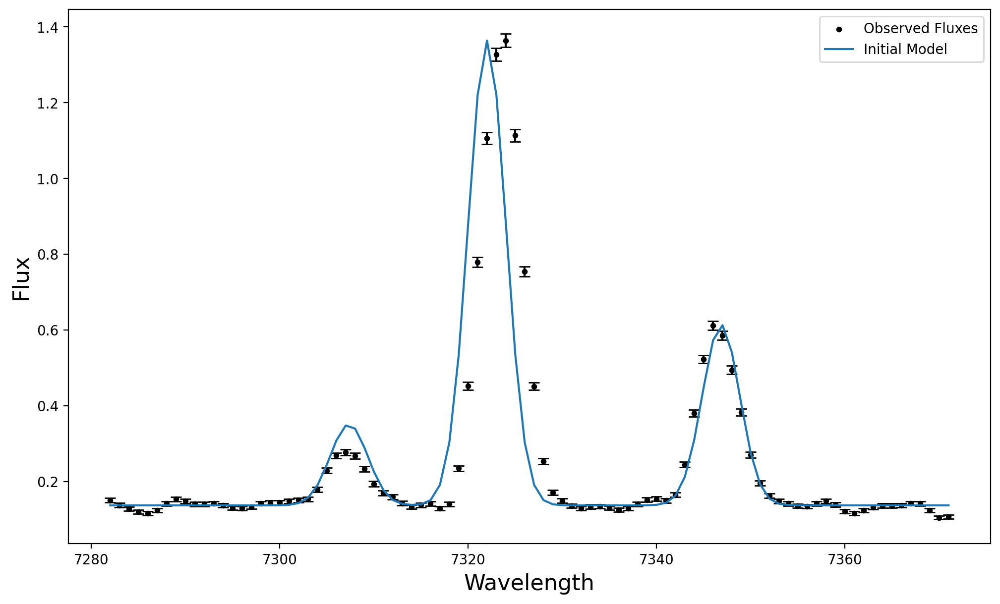

In [51]:
#Rest wavelengths for emission lines

N_II_a = 6549.86 #Angstrom

H_alpha = 6563 #Angstrom

N_II_b = 6585.27 #Angstrom

sigma = 2 #Angstrom


#define the model function for flux based on wavelength and our 5 parameters (z, A_H_alpha, A_N_II_a, A_N_II_b, C)
def spectral_fitting_function(lamb, params):
    
    z = params[0]
    
    A_H_alpha = params[1]
    
    A_N_II_a = params[2]
    
    A_N_II_b = params[3]
    
    C = params[4]
    
    exp_H_alpha = -(lamb-H_alpha*(1+z))**2 / (2 * sigma**2)
    exp_N_II_a = -((lamb- N_II_a*(1+z))**2) / (2 * sigma**2)
    exp_N_II_b = -((lamb- N_II_b*(1+z))**2) / (2 * sigma**2)
    
    flux= C + A_H_alpha*np.exp(exp_H_alpha) + A_N_II_a*np.exp(exp_N_II_a) + A_N_II_b*np.exp(exp_N_II_b)
    return flux
    

##Build initial values for the MCMC


#Estimate the continuum, taken from a piece of spectra with no major emission or absorption features

continuum_35_30_window = spectra_35_30[3450:3600]

C_initial = np.median(continuum_35_30_window)


#Because Hα is by far the strongest emission line, we can be sure the max flux is from the peak of Hα,
#if we subtract the estimated continuum from the maximum flux we should have a good initial guess of A_Hα

H_alpha_initial = max(spectra_35_30_window) - C_initial


#Estimating the strength of the other two lines was pretty tough, but from digging through textbooks and
#Conely et al 2016 we can estimate the strength of [NII]a as being 1/3.5 times as strong as Hα and [NII]b
#as being 1/2 Hα

N_II_a_initial= H_alpha_initial/3.5 - C_initial

N_II_b_initial= H_alpha_initial/2 - C_initial


#Estimate the initial redshift
#Just eyeballing it, the wavelength of Hα is 7322 angstroms, which means we can derive
# redshift estimate


z_initial = 7322 / H_alpha - 1 



spectra_initial_values = [z_initial, H_alpha_initial, N_II_a_initial, N_II_b_initial, C_initial]


spectra_initial = np.array([spectra_initial_values, spectra_initial_values, spectra_initial_values, spectra_initial_values,
                            spectra_initial_values, spectra_initial_values, spectra_initial_values, spectra_initial_values])



def z_prior(z):
    
    return norm.logpdf(z, z_initial, 0.01 * z_initial)


#Note the tight constraints placed on Hα, trust this comes from hours of
#frustration! We really need to constrain this one because there aren't
#many data points around where Hα is on the spectrum so the MCMC won't be inclined
#to try very hard to fit it without a strict prior!


def H_alpha_prior(A_H_alpha):
    
    return norm.logpdf(A_H_alpha, H_alpha_initial, 1e-1000 * H_alpha_initial)
    
    
def N_II_a_prior(A_N_II_a):
    
    return norm.logpdf(A_N_II_a, N_II_a_initial, 0.1 * N_II_a_initial)


def N_II_b_prior(A_N_II_b):
    
    return norm.logpdf(A_N_II_b, N_II_b_initial, 0.1 * N_II_b_initial)



def C_prior(C):
    
    return norm.logpdf(C, C_initial,  C_initial)
    


#I'm also going to tighten up the proposal function to encourage more switches because the current one doesn't do it enough


def tight_gaussian_proposal_func(params):
    return np.random.normal(params, 0.001 * abs(params))


def tight_random_jump_proposal_func(params):
    
    if np.random.rand() < 0.01:
        
        jump = np.random.normal(params,  0.1 * abs(params))
    
    else:
        jump = np.random.normal(params, 2.5e-3 * abs(params))
    
    return jump


#The file I used to get the spectra didn't come with error and getting
#it from poisson error will take AGES so I'll estimate the error using the 
#standard deviation of the continuum scaled by the square root of the flux divided by
#the square root of the median of the continuum

#the idea here is that you still get the square root relation between number of photon
#hitting the detector and the error while having the error in the continuum only due to
#the noise. You'll notice the sqrt of the spectrum divided by the sqrt of the median
#of the median will basically be one for most points in the continuum

spectra_err = np.std(continuum_35_30_window) * np.sqrt(spectra_35_30) / np.sqrt(np.median(continuum_35_30_window))

#find error in area of spectrum we're analyzing

spectra_err_window = spectra_err[3660:3750]


fluxes= spectral_fitting_function(wavelength_window, spectra_initial_values)

plt.scatter(wavelength_window, spectra_35_30_window, color = 'black', label='Observed Fluxes', s = 10)
plt.errorbar(wavelength_window, spectra_35_30_window, yerr = spectra_err_window, linestyle = '', capsize = 4, color = 'black')
plt.plot(wavelength_window, fluxes, label='Initial Model')
plt.xlabel('Wavelength', fontsize = 16)
plt.ylabel(r'Flux', fontsize = 16)
plt.legend(loc="upper right")
plt.show()

In [52]:
spectral_initial_prior = [z_prior, H_alpha_prior, N_II_a_prior, N_II_b_prior, C_prior]


flux_ideal_values, flux_markov_chains, flux_posterior_stdsm, flux_red_chi2 = metropolis_mcmc(wavelength_window, spectra_35_30_window, spectra_err_window, spectral_fitting_function,
                                        log_max_likelihood, spectral_initial_prior, tight_random_jump_proposal_func, spectra_initial, 40000, 15000)

## Optimal parameters achieved! Now the posteriors!

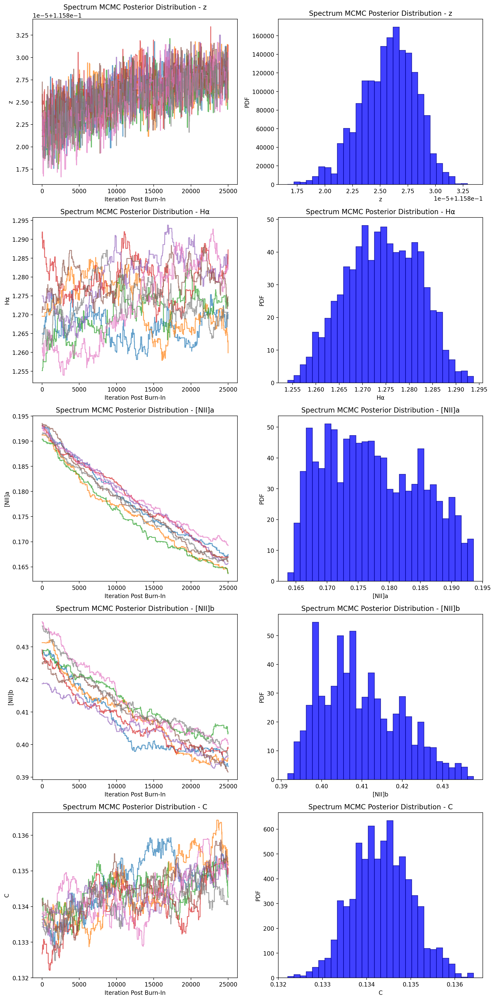

In [53]:
# Plotting the spectrum MCMC test model posterior and markov chains

num_chains, num_params, num_iterations = flux_markov_chains.shape
param_labels = ['z', 'Hα', '[NII]a', '[NII]b', 'C']

# Create subplots cutting out the burn-in of about 15000 iterations
fig, axes = plt.subplots(num_params, 2, figsize=(14, 6 * num_params))

for i in range(num_params):
    param_samples = flux_markov_chains[:, i,:].flatten()

    # Plot Markov Chains
    for chain in range(num_chains):
        axes[i, 0].plot(range(num_iterations), flux_markov_chains[chain, i, :], alpha=0.7)
    axes[i, 0].set_title(f'Spectrum MCMC Posterior Distribution - {param_labels[i]}')
    axes[i, 0].set_xlabel('Iteration Post Burn-In')
    axes[i, 0].set_ylabel(param_labels[i])

    # Plot Posterior distribution
    axes[i, 1].hist(param_samples, bins=30, alpha=0.75, color='blue', edgecolor='darkblue', density=True)
    axes[i, 1].set_title(f'Spectrum MCMC Posterior Distribution - {param_labels[i]}')
    axes[i, 1].set_xlabel(param_labels[i])
    axes[i, 1].set_ylabel('PDF')

plt.show()

You may notice that the rate of acceptance isn't around that 25% sweet spot but from tinkering with the proposal function tightening the jumps causes the MCMC to need like 60,000 iterations to stop burning in so we'll rock with this. An appropriate alteration we could've made is making adaptive jump sizes that would be large in the beginning but shrink as the code runs. Unfortunately we ran out of time and couldn't quite implement it!

Now that we have obtained the optimal parameters for our spectral fitting function, let's plot our function next to the actual spectral emissions to see how they compare


The Best Fit for z is 0.11582597333242962 ± 2.5028832861763293e-06
The Best Fit for Ηα is 1.2743137404231248 ± 0.0077372291435672475
The Best Fit for [NII]a is 0.17669692320931207 ± 0.007594490327637966
The Best Fit for [NII]b is 0.4079809712369894 ± 0.009917933769912266
The Best Fit for C is 0.13435498012343383 ± 0.000673567250311011
The reduced chi squared for the best fit is 40.2391195285043


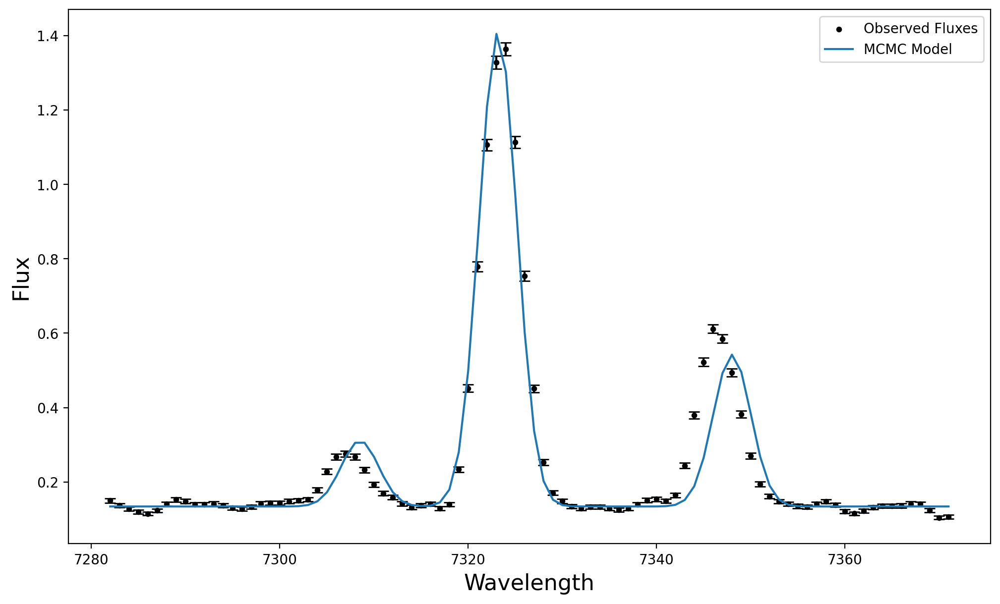

In [54]:

fluxes= spectral_fitting_function(wavelength_window,flux_ideal_values)

print("The Best Fit for z is " + str(flux_ideal_values[0]) + ' ± ' + str(flux_posterior_stdsm[0]))

print("The Best Fit for Ηα is " + str(flux_ideal_values[1]) + ' ± ' + str(flux_posterior_stdsm[1]))

print("The Best Fit for [NII]a is " + str(flux_ideal_values[2]) + ' ± ' + str(flux_posterior_stdsm[2]))

print("The Best Fit for [NII]b is " + str(flux_ideal_values[3]) + ' ± ' + str(flux_posterior_stdsm[3]))

print("The Best Fit for C is " + str(flux_ideal_values[4]) + ' ± ' + str(flux_posterior_stdsm[4]))

print("The reduced chi squared for the best fit is " + str(flux_red_chi2))

plt.scatter(wavelength_window, spectra_35_30_window, color = 'black', label='Observed Fluxes', s = 10)
plt.errorbar(wavelength_window, spectra_35_30_window, yerr = spectra_err_window, linestyle = '', capsize = 4, color = 'black')
plt.plot(wavelength_window, fluxes, label='MCMC Model')
plt.xlabel('Wavelength', fontsize = 16)
plt.ylabel(r'Flux', fontsize = 16)
plt.legend(loc="upper right")
plt.show()

## Generalize to ANY Spaxel


Now, let's take some random spaxel:

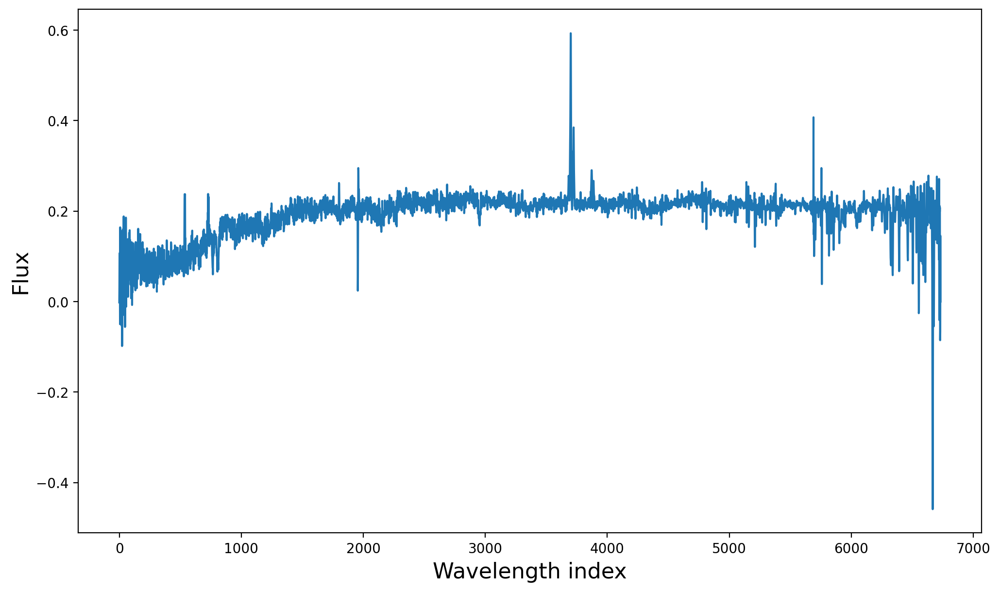

In [55]:
x = 34

y = 40

plt.plot(Manga_lincube[1].data[:, x, y])
plt.xlabel('Wavelength index', fontsize = 16)
plt.ylabel(r'Flux', fontsize = 16)
plt.show()


spectra_x_y = Manga_lincube[1].data[:, x, y]

spectra_x_y = spectra_x_y[500:4200]

wavelength = np.linspace(3622, 10353, 6732)

wavelength = wavelength[500:4200]



## Automation

How are we going to characterize the features of this spaxel without having to manually compute the initial values and priors of each line manually like we did in the last one? For this galaxy there are HUNDREDS of spaxels, computing these by hand is such a hassle. Luckily, we can leverage one basic fact to automate this entire process for us!

The way we'll generalize this to any IFU spaxel is using Hα as our anchor. For any spaxel Ηα will for sure be the brightest point in wavelength space. If we can hunt down the wavelength of Hα we can tell the code to search for a range of wavelength to the left and right to find the emission of the two [NII] lines and the continuum. This isn't super clear because what we really want is the index at which we should expect the peaks of Hα and the [NII] lines but we can still use our knowledge of the rest wavelengths of the emission lines and the spacing of flux points in wavelength space to figure out where to look. First we need to find Hα, which is pretty easy using np.where which will tell us where the flux of the spaxel is at its maximum. Then we need to estimate the continuum second. This is because the peak flux from all the lines is the linear sum of the amplitude of the line PLUS the continuum emission, so without it we can't intialize the amplitude of the emission features. Estimating the continuum is also deceptively tricky. Ideally we want a region of the spectrum away from major features so we can get an idea of what the flat part is like. We'll take the median value and accept that as the continuum. I've found that if you look 150 to 50 angstroms to the left of Hα there's nothing there and you can estimate the continuum from the median value. 

With this we can estimate the amplitude of Hα as the maximum flux minus this continuum emission.

Finding the [NII] also gets tricky.  If we know that the difference in wavelength between Hα and [NII], $\lambda_{H\alpha} - \lambda_{[NII]a}$, and we know each flux measurement is evenly separated by wavelength dλ (which is 1 angstrom here) then we can calculate the number of induces to the left we should look as $(\lambda_{H\alpha} - \lambda_{[NII]a} )* d\lambda$ (rounding to the nearest integer). For [NII]b we'll do the opposite and look to the right based on the difference in wavelength between Hα and [NII]b.

Once we have an estimation of where the emission line is we'll estimate it's intensity by isolating the gaussian curve that covers the line. We'll grab the flux points 5 Angstroms above and below our estimated wavelengths and figure out what the max flux is there. With those we should have estimations of all three of our emission lines after subtracting the continuum. As you'll see below we may not be perfect in capturing the wavelengths of a feature but we are robust in figuring out their amplitudes which is all that matters for our model.

With the location of Hα we can also immediately estimate the redshift using the formula:

$z = 1 - \Large\frac{\lambda_{obs}}{\lambda_{rest}}$ where $\lambda_{obs}$ is the wavelength we estimate an emission line to be. It's pretty intuitive.

Estimating the continuum is also deceptively tricky. Ideally we want a region of the spectrum away from major features so we can get an idea of what the flat part is like. We'll take the median value and accept that as the continuum. I've found that if you look 150 to 50 angstroms to the left of Hα there's nothing there and you can estimate the continuum from the median value.

It's at this point we should mention an important feature of redshifting, the broadening of spectra. The more redshifted a source is, the broader the spectral features. This is easy to show using basic equations about redshift:

$\lambda_{obs} = (1+z) \lambda_{rest}$

So if we take the difference between two features, $\lambda_1$ and $\lambda_2$ we'll see the following:


$\lambda_{1, obs} - \lambda_{2, obs} = (1+z) (\lambda_{1, rest} - \lambda_{2, rest})$

So for any z > 0 the differece in wavelength space between the features will increase including line widths and locations. HOWEVER, because we're only dealing with differences in redshift due to the rotation of a single galaxy it's unlikely that failing to account for this will cause any significant issue for the calculations done in this code so we can ignore it.

Below is a quick cell that shows how to find the location of Hα and plots a region of the continuum to demostrate it's just a noisy set of points. The one below will being all our ideas together and intialize our MCMC and set the priors.

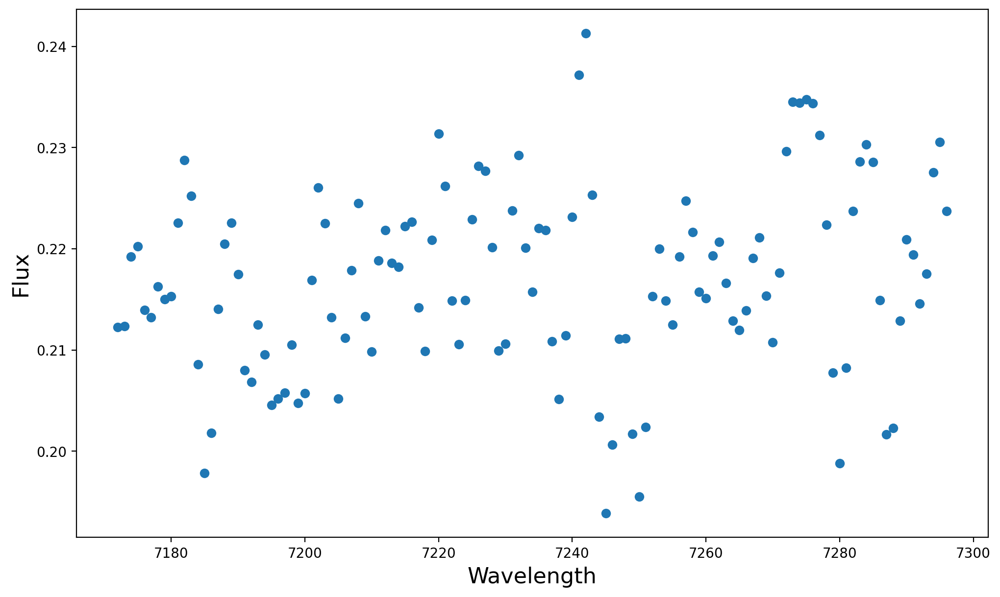

In [56]:
#Rest wavelengths for emission lines

N_II_a = 6549.8 #Angstrom

H_alpha = 6563 #Angstrom

N_II_b = 6585 #Angstrom

sigma = 2 #Angstrom


#Find where Hα is
#it'll be where maximum flux is

H_alpha_index = np.where((spectra_x_y == max(spectra_x_y)))[0][0]

H_alpha_initial = spectra_x_y[H_alpha_index]

H_alpha_wavelength = wavelength[H_alpha_index]


#zoom in on continuum to the left of Hα

continuum_wavelength = wavelength[H_alpha_index - 150:H_alpha_index - 25]

continuum_window = spectra_x_y[H_alpha_index - 150:H_alpha_index - 25]


#The file I used to get the spectra didn't come with error and getting
#it from poisson error will take AGES so I'll estimate the error using the 
#standard deviation of the continuum scaled by the square root of the flux divided by
#the square root of the median of the continuum

#the idea here is that you still get the square root relation between number of photon
#hitting the detector and the error while having the error in the continuum only due to
#the noise. You'll notice the sqrt of the spectrum divided by the sqrt of the median
#of the median will basically be one for most points in the continuum

spectra_err = np.std(continuum_window) * spectra_x_y / np.sqrt(np.median(continuum_window))


plt.scatter(continuum_wavelength, continuum_window)
plt.xlabel('Wavelength', fontsize = 16)
plt.ylabel(r'Flux', fontsize = 16)
plt.show()

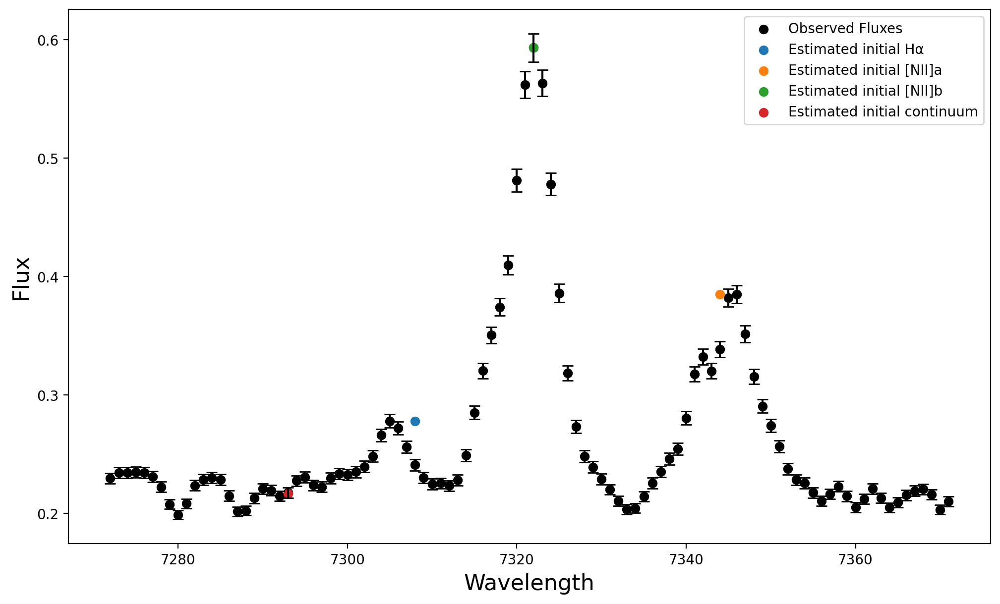

In [57]:

#Find where Hα is
#it'll be where maximum flux is

H_alpha_index = np.where((spectra_x_y == max(spectra_x_y)))[0][0]


#zoom in on continuum to the left of Hα

continuum_wavelength = wavelength[H_alpha_index - 150:H_alpha_index - 25]

continuum_window = spectra_x_y[H_alpha_index - 150:H_alpha_index - 25]

## Derive initial continuum

C_initial = np.mean(continuum_window)


#with the location fo Hα AND the continuum, we can estimate the strength of Ηα

H_alpha_initial = spectra_x_y[H_alpha_index] - C_initial

H_alpha_wavelength = wavelength[H_alpha_index]

#because we know the rest wavelengths of the two NII lines
#we can guess around where their peaks are


#difference between wavelengths of Hα and NII_a

N_II_a_dx = H_alpha - N_II_a

#find that index

N_II_a_index = int(H_alpha_index - N_II_a_dx * (wavelength[1] - wavelength[0]))


#estimate the max around this wavelength

N_II_a_initial = max(spectra_x_y[(N_II_a_index - 5):(N_II_a_index + 5)]) - C_initial


#difference between wavelengths of Hα and NII_b

N_II_b_dx = N_II_b - H_alpha


#find that index

N_II_b_index = int(H_alpha_index + N_II_b_dx * (wavelength[1] - wavelength[0]))

#estimate the max around this wavelength

N_II_b_initial = max(spectra_x_y[(N_II_b_index - 5):(N_II_b_index + 5)]) - C_initial


## Derive initial redshift

z_initial = H_alpha_wavelength / H_alpha - 1



def z_prior(z):
    
    return norm.logpdf(z, z_initial, 0.05)


#Note the tight constraints placed on Hα, trust this comes from hours of
#frustration! We really need to constrain this one because there aren't
#many data points around where Hα is on the spectrum so the MCMC won't be inclined
#to try very hard to fit it without a strict prior!


def H_alpha_prior(A_H_alpha):
    
    return norm.logpdf(A_H_alpha, H_alpha_initial, 1e-100 * H_alpha_initial)
    
    
def N_II_a_prior(A_N_II_a):
    
    return norm.logpdf(A_N_II_a, N_II_a_initial, 0.01 * N_II_a_initial)


def N_II_b_prior(A_N_II_b):
    
    return norm.logpdf(A_N_II_b, N_II_b_initial, 0.01 * N_II_b_initial)



def C_prior(C):
    
    return norm.logpdf(C, C_initial, 0.1 * C_initial)


#I'm also going to tighten up the proposal function to encourage more switches because the current one doesn't do it enough


def tight_gaussian_proposal_func(params):
    return np.random.normal(params, 0.005 * abs(params))





#plot the guesses over the data points


#zoom in on region around H-alpha

spectra_window = spectra_x_y[H_alpha_index - 50:H_alpha_index + 50]

wavelength_window = wavelength[H_alpha_index - 50:H_alpha_index + 50]

spectra_err_window = spectra_err[H_alpha_index - 50:H_alpha_index + 50]

#plot the data along with the estimated values of the continuum
#the x locations of the colored dots doesn't matter so match as their
#estimated y values are, some of the locations of the peaks of the emission
#lines may appear shifted but so long as we know their rest wavelengths and a good
#guess for the line strength the code WILL work!

plt.scatter(wavelength_window, spectra_window, color = 'black', label='Observed Fluxes')
plt.scatter(wavelength[N_II_a_index], N_II_a_initial + C_initial, label = 'Estimated initial Hα')
plt.scatter(wavelength[N_II_b_index], N_II_b_initial + C_initial, label = 'Estimated initial [NII]a')
plt.scatter(wavelength[H_alpha_index], H_alpha_initial + C_initial, label = 'Estimated initial [NII]b')
plt.scatter(wavelength[N_II_a_index] - 15, C_initial, label = 'Estimated initial continuum')
plt.errorbar(wavelength_window, spectra_window, yerr = spectra_err_window, linestyle = '', capsize = 4,
             color = 'black')
plt.xlabel('Wavelength', fontsize = 16)
plt.ylabel(r'Flux', fontsize = 16)
plt.legend(loc="upper right")
plt.show()

### Moment of truth

Okay, let's get this puppy running! This time around we haven't eyeballed any inital guesses or priors, we're just leveraging our astro knowledge that Hα should be the dominant feature in any spectrum for this galaxy to automatically initialize the MCMC.

In [58]:
spectral_initial_prior = [z_prior, H_alpha_prior, N_II_a_prior, N_II_b_prior, C_prior]


spectra_initial_values = [z_initial, H_alpha_initial, N_II_a_initial, N_II_b_initial, C_initial]

spectra_initial = np.array([spectra_initial_values, spectra_initial_values, spectra_initial_values, spectra_initial_values,
                            spectra_initial_values, spectra_initial_values, spectra_initial_values, spectra_initial_values])

flux_ideal_values, flux_markov_chains, flux_posterior_stdsm, flux_red_chi2 = metropolis_mcmc(wavelength_window, spectra_window, spectra_err_window, spectral_fitting_function,
                                        log_max_likelihood, spectral_initial_prior, tight_random_jump_proposal_func, spectra_initial, 36000, 15000)

The Best Fit for z is 0.11556810052753722 ± 3.766773260827359e-06
The Best Fit for Ηα is 0.41513215680929316 ± 0.0034135860745035684
The Best Fit for [NII]a is 0.05418825893425912 ± 0.001799350946175436
The Best Fit for [NII]b is 0.17383308987423157 ± 0.003107253297212142
The Best Fit for C is 0.22539780675861523 ± 0.0003516119381473337
The reduced chi squared for the best fit is 22.569321430081597


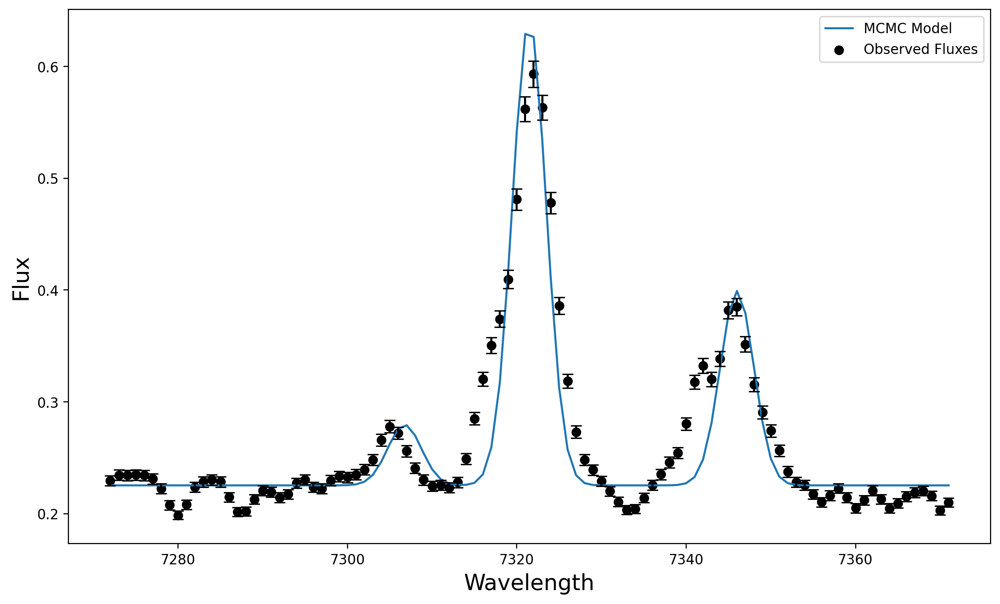

In [59]:
fluxes = spectral_fitting_function(wavelength_window, flux_ideal_values)

print("The Best Fit for z is " + str(flux_ideal_values[0]) + ' ± ' + str(flux_posterior_stdsm[0]))

print("The Best Fit for Ηα is " + str(flux_ideal_values[1]) + ' ± ' + str(flux_posterior_stdsm[1]))

print("The Best Fit for [NII]a is " + str(flux_ideal_values[2]) + ' ± ' + str(flux_posterior_stdsm[2]))

print("The Best Fit for [NII]b is " + str(flux_ideal_values[3]) + ' ± ' + str(flux_posterior_stdsm[3]))

print("The Best Fit for C is " + str(flux_ideal_values[4]) + ' ± ' + str(flux_posterior_stdsm[4]))

print("The reduced chi squared for the best fit is " + str(flux_red_chi2))

plt.plot(wavelength_window, fluxes, label='MCMC Model')
plt.scatter(wavelength_window, spectra_window, color = 'black', label='Observed Fluxes')
plt.errorbar(wavelength_window, spectra_window, yerr = spectra_err_window, linestyle = '', capsize = 4,
             color = 'black')
plt.xlabel('Wavelength', fontsize = 16)
plt.ylabel(r'Flux', fontsize = 16)
plt.legend(loc="upper right")
plt.show()

We have a feeling we're underestimating the error because the shape of the data itself does look a bit off from what's expected, there a weird hump on the left side of Hα and [NII]b is doesn't quite resemble a gaussian and the dip between Hα and [NII]b is strangely deep which all should really throw off our code. A potential improvement to the model could be to add three new degrees of freedom for the widths of each line since they may not all be 2 Angstorms. There's also the simple fact that there are likely other features that aren't being fit that can mess up the likelihood of the best fit. I also can't tell why the peaks of the two [NII] lines are off from where they should be! I don't think this is a problem with the model as it should already account for the fact that the relative spacing of the lines changes with increasing redshift. There may be dynamics in the galaxy itself that is causing this shift that our model hasn't accounted for or more noise than can be estimated from the median of the portion of the spectrum we took. At the end of the day we decided not to change the error estimate because 1) Our initial guess of the error has some merit given we didn't have time to do the full poisson noise given only the spectra in some funky units and 2) adjusting the error would ultimately mean increasing it until it matches our result which is not best practice. Ultimately we're satisfied with our model and saying the error is likely a little bit higher than what we estimated and the model lacks some extra bits like varying the widths of each of the lines and fitting for more subtle features. We just set appropriate priors and initial values using how we know the lines to be spaced apart and let the code do the rest.

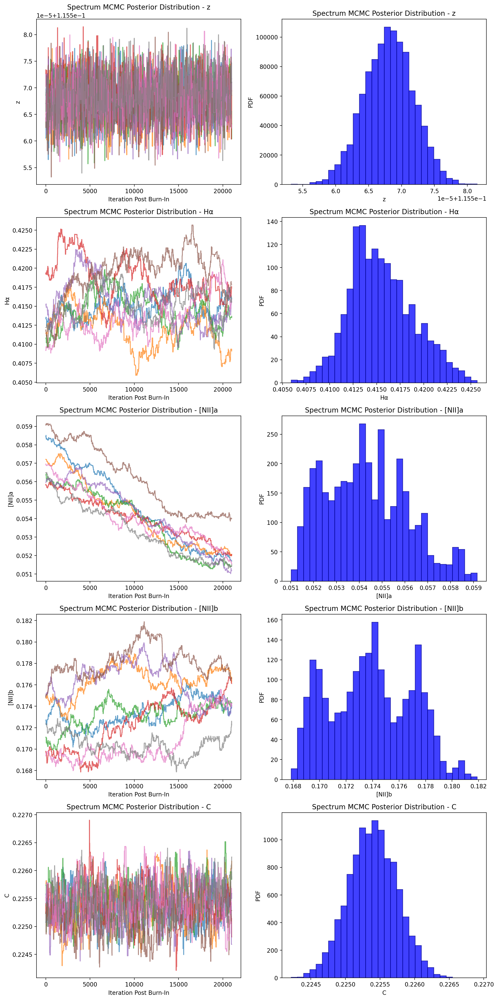

In [60]:
# Plotting the spectrum MCMC test model posterior and markov chains

num_chains, num_params, num_iterations = flux_markov_chains.shape
param_labels = ['z', 'Hα', '[NII]a', '[NII]b', 'C']

# Create subplots that cut out the first 15,000 iterations that represent the burn in
fig, axes = plt.subplots(num_params, 2, figsize=(14, 6 * num_params))

for i in range(num_params):
    param_samples = flux_markov_chains[:, i, :].flatten()

    # Plot Markov Chains
    for chain in range(num_chains):
        axes[i, 0].plot(range(num_iterations), flux_markov_chains[chain, i,:], alpha=0.7)
    axes[i, 0].set_title(f'Spectrum MCMC Posterior Distribution - {param_labels[i]}')
    axes[i, 0].set_xlabel('Iteration Post Burn-In')
    axes[i, 0].set_ylabel(param_labels[i])

    # Plot Posterior distribution
    axes[i, 1].hist(param_samples, bins=30, alpha=0.75, color='blue', edgecolor='darkblue', density=True)
    axes[i, 1].set_title(f'Spectrum MCMC Posterior Distribution - {param_labels[i]}')
    axes[i, 1].set_xlabel(param_labels[i])
    axes[i, 1].set_ylabel('PDF')

plt.show()

### Estimate SFR

Now we can take the posterior result of the fitting and estimate the stellar formation rate in solar masses per year. For this we'll use the review article Kennicut & Evans 2012 to calibrate the luminosity of Hα to the SFR in solar masses per year as:

$log(\dot{M_*}) = \log(L_{H\alpha}) - 41.27$

Where $L_{H\alpha}$ is in $\frac{\text{erg}}{s}$

Now we'll need to convert the amplitudes from the posterior to units of flux density which means we'll need to multiply by the rest wavelength of Hα, 6563 angstroms, as well at $10^{-17}$ to go from the units of $10^{−17} \text{erg} * \text{s}^{−1} \text{cm}^{−2} \text{Angstrom}^{−1} \text{spaxel}^{−1}$ to $\text{erg} * \text{s}^{−1} \text{cm}^{−2}$ (we're only using one spaxel). Using the equation:

$L_{H\alpha} = F_{H\alpha}4 \pi d^2$ will return the luminosity of Hα in erg/s so long as the distance is given in cm. We can find the distance as the luminosity distance using the astropy package plugging in our estimate of the redshift. To estimate the uncertainty of the SFR we need the uncertainty of the square of the distance and the uncertainty of the flux density of Hα. The propagation of the product of two uncorrelated variables follows as:

$\sigma_{L_{H\alpha}} = {L_{H\alpha}} \Large \sqrt{\frac{\sigma_{F}}{F_{H\alpha}} + \frac{\sigma_{d^2}}{d^2}}$ where $\sigma_{d^2} = 2d\sigma_d$


$\sigma_{L_{H\alpha}} = {L_{H\alpha}} \Large \sqrt{\frac{\sigma_{F}}{F_{H\alpha}} + \frac{2\sigma_{d}}{d}}$


One last step, we need to find the uncertainty of $\log(L_{H\alpha})$ which is:

$\sigma_{\log{L_{H\alpha}}} = \frac{\sigma_{L_{H\alpha}}}{L_{H\alpha}\ln{10}}$

In [61]:
#Unpack ideal values

z_ideal = flux_ideal_values[0]

H_alpha_ideal = flux_ideal_values[1]


#unpack standard deviation of posteriors


z_posterior = flux_markov_chains[:, 0, :].flatten()

z_std = np.std(z_posterior)


H_alpha_posterior = flux_markov_chains[:, 1, :].flatten()

H_alpha_std = np.std(H_alpha_posterior)



#calculate distance

dist_Mpc = cosmo.luminosity_distance(z_ideal).value


#For low redshifts the Hubble Law holds pretty well meaning the uncertainty of the 
#distance is proportional to the uncertainty of the redshift

sigma_dist_Mpc = dist_Mpc * z_std

#convert to cm 

Mpc_to_cm = 3.086 * 10**24 #cm/Mpc

dist_cm = dist_Mpc * Mpc_to_cm #dist to galaxy in cm

sigma_dis_cm = sigma_dist_Mpc * Mpc_to_cm

#convert flux to erg/s/cm^2

F_H_alpha_erg = H_alpha_ideal * 10**-17 * H_alpha #flux of Hα in erg/sec

sigma_F_H_alpha_erg = F_H_alpha_erg * H_alpha_std

#calculate the luminosity of the line

L_H_alpha = 4 * np.pi * dist_cm**2 * F_H_alpha_erg


#Uncertainty of luminosity

sigma_L_H_alpha = L_H_alpha * np.sqrt(sigma_F_H_alpha_erg / F_H_alpha_erg + 2 * sigma_dis_cm / dist_cm)


#calculate the log SFR

log_SFR = np.log10(L_H_alpha) - 41.27 #SFR in solar mass per year


#Uncertainty of log SFR

sigma_log_SFR = sigma_L_H_alpha / (L_H_alpha * np.log(10))


#Put into linear space

SFR = 10**log_SFR

sigma_SFR = 10**sigma_log_SFR


print('The log SFR in solar masses per year is ' + str(round(log_SFR, 3)) + ' ± ' + str(round(sigma_log_SFR, 3)))

print('')

print('The SFR is ' + str(round(SFR, 3)) + ' ± ' + str(round(sigma_SFR, 3)) + ' solar masses per year')

The log SFR in solar masses per year is 0.713 ± 0.025

The SFR is 5.17 ± 1.06 solar masses per year


I'd say this value is reasonable when we consider this is only one spaxel for a $10^{11} M_{\odot}$ star forming galaxy. With about 50 spaxels max containing star forming regions of the galaxy that gives a upper estimate of 250 solar masses per year which is on par with the star forming main sequence of local galaxies found by SDSS.

![](https://cocalc.com/blobs/paste-0.06168121468604815?uuid=de57e6a2-bc8e-4b9c-9cc4-bbd3409f8805)
# Key Takeaways

MCMCs are super interesting methods to idealize a model to match a physical system using stats and random number generation to randomly walk from one area of parameter space to a more ideal one. Furthermore, in tracking the iterations that occur after the burn-in we get a sense of confidence in the results via the posterior, the distribution of values attempted in the MCMC. However, as we scale up in the complexity of models it becomes vital to carefully select the initial values and priors of your code to make sure your MCMC nears the ideal solution in a reasonable time or doesn't get stuck in some region of parameter space far away from the ideal values. However, this kind of the beauty of Bayesian Statistics, we can inpart our knowledge of the system to get it to the solutions we know to be reasonable much faster. Just by looking at the distribution of data or using our knowledge of physical systems we can tell an MCMC that it doesn't need to wander forever to get to reasonable answer before reaching the iteration limit. Instead, we can push it in the right direction with sufficiently strict priors and really good inital values. Of course this comes with a word of caution as this kind of thinking always brings confirmation bias as it may be natural to believe an MCMC is doing a bad job because the priors aren't tight enough or the intial values are exact enough when it may be the case the whole model is wrong or some assumptions in picking the intial parameters or priors are wrong and the MCMC is truly better suited searching in a different area of parameter space.